# 수입식품_ 해외제조가공업체_식품_2019년_ EDA

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
# Imports
import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.family']='Malgun Gothic'

In [2]:
def summary(df):
    
    return pd.DataFrame({
        '데이터형태(dtypes)':{col:df[col].dtype for col in df},
        '고유값 수(nunique)':{col:len(df[col].unique()) for col in df},
        '결측치 비율(%)':{col:str(round(sum(df[col].isna())/len(df),2)*100)+'%' for col in df},
        '중복건수':{col:sum(df[col].duplicated()) for col in df},
        '자료 내용(contents)':{col:df[col].unique() for col in df},
                 })

# 1. 데이터 확보

In [3]:
# 필요한 변수만 채택
path = r'D:\smart food\data\현지실사'
df = pd.read_excel(path + '/해외업소대장.xlsx')

df.to_pickle(path + '/해외업소대장.pkl')

In [4]:
df = pd.read_pickle(path + '/해외업소대장.pkl')
df.head()
df.shape

,해외제조업소 코드,국가코드,국가명,지역 코드,지역명,구 대장 등록번호,해외제조업소 명,해외제조업소 대표자 성명,해외제조업소 주소,해외제조업소 전화번호,...,식품종료일시(업소등록 만료일자),수산 시작 일시,수입중단 번호,자동 갱신 대상 여부,시설 취소 일시,경도,위도,정제주소,HACCP 의무적용 대상 여부,HACCP 인증 여부
0,CN000095353,CN,중국,CN-JS,NaN,NaN,"LIANYUNGANG YINGJI AQUATIC PRODUCTS CO., LTD",ZHENG YINGJI,DONGZHENG VILLAGE ，SONGZHUANG TOWN，GANYU DISTR...,8613179598868,...,2022/03/22 00:00:00,2020/03/23 17:36:14,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
1,CN000095354,CN,중국,CN-JS,NaN,NaN,JIANGYIN YUANXIANG TEXTILE TECHNOLOGY CO. LTD,QIAN ZHIBIN,"NO.28, HUAYUAN ROAD, XINGONG VILLAGE, GUSHAN T...",86051086323228,...,2022/03/22 00:00:00,NaN,NaN,N,NaN,NaN,NaN,"NO.28 HUA YUAN LU, XINGONG VILLAGE, GUSHANZHEN...",NaN,NaN
2,JP000022788,JP,일본,JP-01,NaN,NaN,"FINE CO., LTD",MR. SHINTARO SETO,"8-123, NISHI HAMACHO, NEMURO-CITY, HIOKKAIDO, ...",81153223501,...,NaN,2020/03/24 14:34:32,NaN,N,NaN,NaN,NaN,"8-123, NISHIHAMACHO, NEMURO SHI, HOKKAIDO, 087...",NaN,NaN
3,CN000095360,CN,중국,CN-AH,NaN,NaN,MAANSHAN FEIYANG ENVIRONMENTAL PROTECTION CONT...,GAO ZHONG KU,"BUILDING 5, NO.1769, HONGQI SOUTH ROAD, MAANSH...",863127828188,...,2022/03/23 00:00:00,NaN,NaN,N,NaN,NaN,NaN,"1769, 5 HONGQI S RD, YUSHAN QU, MAANSHAN SHI, ...",NaN,NaN
4,CN000095364,CN,중국,CN-ZJ,NaN,NaN,YIWU SHI AIMO DIANZI KEJI YOUXIAN GONGSI,BIEHUI,"QINGKOU EAST DISTRICT, JIANGDONG STREET, YIWU ...",8613735897567,...,2022/03/24 00:00:00,NaN,NaN,N,NaN,NaN,NaN,"QING KOU LU, YIWU SHI, JINHUA SHI, ZHEJIANG SH...",NaN,NaN


(301809, 41)

In [10]:
df.columns

Index(['해외제조업소 코드', '국가코드', '국가명', '지역 코드', '지역명', '구 대장 등록번호', '해외제조업소 명',
       '해외제조업소 대표자 성명', '해외제조업소 주소', '해외제조업소 전화번호', '해외제조업소 이메일주소',
       '해외제조업소 팩스번호', '식품안전관리시스템 적용 여부', '식품안전관리시스템 인증 여부', '인증 명', '인증 기관 명',
       '인증 기관 인증 일시', '인증 기관 만료 일시', '취하 여부', '취하 일시', '취소 중단 코드', '취소(중단)상태',
       '수산물 수출업소 번호', '수산물 등록 시설 번호', '수산물 국립농산물품질관리원 코드', '약정/부산물구분',
       '수동등록구분코드(Y:서류, N:전자민원)', '생산품목', '비고', '현지 실사 방해 기피 여부',
       '식품시작일시(업소등록일자)', '식품종료일시(업소등록 만료일자)', '수산 시작 일시', '수입중단 번호',
       '자동 갱신 대상 여부', '시설 취소 일시', '경도', '위도', '정제주소', 'HACCP 의무적용 대상 여부',
       'HACCP 인증 여부'],
      dtype='object')

In [20]:
summary(df)

,데이터형태(dtypes),고유값 수(nunique),결측치 비율(%),중복건수,자료 내용(contents)
해외제조업소 코드,object,301809,0.0%,0,"[CN000095353, CN000095354, JP000022788, CN0000..."
국가코드,object,205,0.0%,301604,"[CN, JP, FR, VN, IT, DE, NL, BD, FI, IN, MY, D..."
국가명,object,205,0.0%,301604,"[중국, 일본, 프랑스, 베트남, 이탈리아, 독일, 네덜란드, 방글라데시, 핀란드,..."
지역 코드,object,2171,33.0%,299638,"[CN-JS, JP-01, CN-AH, CN-ZJ, FR-PDL, VN-SG, FR..."
지역명,float64,1,100.0%,301808,[nan]
구 대장 등록번호,float64,76913,75.0%,224896,"[nan, 45323.0, 31275.0, 31635.0, 31876.0, 4641..."
해외제조업소 명,object,204415,24.0%,97394,"[LIANYUNGANG YINGJI AQUATIC PRODUCTS CO., LTD ..."
해외제조업소 대표자 성명,object,77807,69.0%,224002,"[ZHENG YINGJI, QIAN ZHIBIN, MR. SHINTARO SETO,..."
해외제조업소 주소,object,268216,4.0%,33593,[DONGZHENG VILLAGE ，SONGZHUANG TOWN，GANYU DIST...
해외제조업소 전화번호,object,80031,69.0%,221778,"[8613179598868, 86051086323228, 81153223501, 8..."


In [23]:
df['식품종료일시(업소등록 만료일자)']

0         2022/03/22 00:00:00
1         2022/03/22 00:00:00
2                         NaN
3         2022/03/23 00:00:00
4         2022/03/24 00:00:00
                 ...         
301804    2024/01/13 00:00:00
301805    2024/01/13 00:00:00
301806    2024/01/13 00:00:00
301807    2024/01/13 00:00:00
301808    2024/01/13 00:00:00
Name: 식품종료일시(업소등록 만료일자), Length: 301809, dtype: object

In [24]:
df['취소(중단)상태'].value_counts()

등록취소    211097
등록       90483
수입중단       163
수입거부        66
Name: 취소(중단)상태, dtype: int64

<AxesSubplot:>

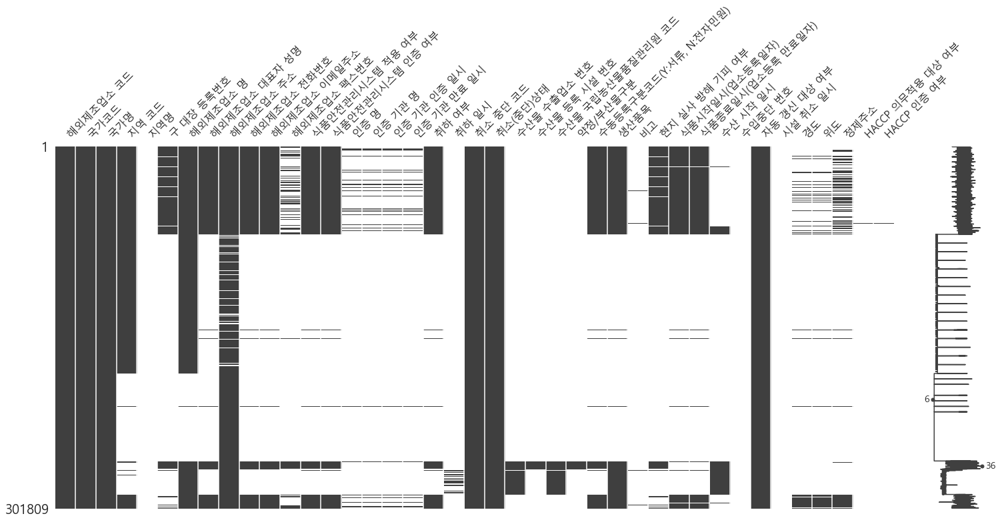

In [12]:
import missingno as msn
msn.matrix(df)

In [33]:
tf = df[(df['취하 여부'] == 'N') & (df['취소 중단 코드'] == 'N')]

In [40]:
tf.columns

Index(['해외제조업소 코드', '국가코드', '국가명', '지역 코드', '지역명', '구 대장 등록번호', '해외제조업소 명',
       '해외제조업소 대표자 성명', '해외제조업소 주소', '해외제조업소 전화번호', '해외제조업소 이메일주소',
       '해외제조업소 팩스번호', '식품안전관리시스템 적용 여부', '식품안전관리시스템 인증 여부', '인증 명', '인증 기관 명',
       '인증 기관 인증 일시', '인증 기관 만료 일시', '취하 여부', '취하 일시', '취소 중단 코드', '취소(중단)상태',
       '수산물 수출업소 번호', '수산물 등록 시설 번호', '수산물 국립농산물품질관리원 코드', '약정/부산물구분',
       '수동등록구분코드(Y:서류, N:전자민원)', '생산품목', '비고', '현지 실사 방해 기피 여부',
       '식품시작일시(업소등록일자)', '식품종료일시(업소등록 만료일자)', '수산 시작 일시', '수입중단 번호',
       '자동 갱신 대상 여부', '시설 취소 일시', '경도', '위도', '정제주소', 'HACCP 의무적용 대상 여부',
       'HACCP 인증 여부'],
      dtype='object')

In [43]:
sel_col = ['해외제조업소 코드', '국가명', '해외제조업소 명',
       '해외제조업소 대표자 성명', '해외제조업소 주소', '해외제조업소 전화번호', '해외제조업소 이메일주소',
       '해외제조업소 팩스번호', '식품안전관리시스템 적용 여부', '식품안전관리시스템 인증 여부', '인증 명', '인증 기관 명',
       '인증 기관 인증 일시', '인증 기관 만료 일시', '생산품목', '현지 실사 방해 기피 여부',   
 '식품시작일시(업소등록일자)', '식품종료일시(업소등록 만료일자)', 'HACCP 의무적용 대상 여부', 'HACCP 인증 여부']

In [45]:
summary(tf[sel_col])[['고유값 수(nunique)', '자료 내용(contents)']]

,고유값 수(nunique),자료 내용(contents)
해외제조업소 코드,90477,"[CN000095353, CN000095354, JP000022788, CN0000..."
국가명,186,"[중국, 일본, 프랑스, 베트남, 이탈리아, 독일, 네덜란드, 방글라데시, 핀란드,..."
해외제조업소 명,86928,"[LIANYUNGANG YINGJI AQUATIC PRODUCTS CO., LTD ..."
해외제조업소 대표자 성명,76786,"[ZHENG YINGJI, QIAN ZHIBIN, MR. SHINTARO SETO,..."
해외제조업소 주소,88853,[DONGZHENG VILLAGE ，SONGZHUANG TOWN，GANYU DIST...
해외제조업소 전화번호,78882,"[8613179598868, 86051086323228, 81153223501, 8..."
해외제조업소 이메일주소,75465,"[hanchangyuwang@hotmail.com, 1915718832@qq.com..."
해외제조업소 팩스번호,28652,"[nan, 8657684251299, 88041813836, 33556505421,..."
식품안전관리시스템 적용 여부,3,"[N, Y, nan]"
식품안전관리시스템 인증 여부,3,"[N, Y, nan]"


<AxesSubplot:>

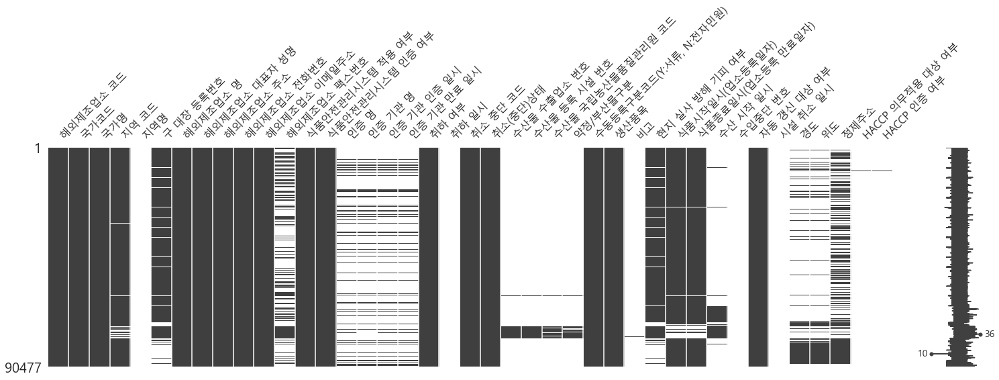

In [38]:
msn.matrix(tf, figsize=(25,6))

In [8]:
df = df[df['판정결과'] != '점검불가']

In [9]:
df.columns

Index(['업소연번', '분야', '년도', '국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형',
       '세부유형', '결과', '판정결과', '업소위치', '작업장 연수', '대지면적', '건물전체면적', '작업장면적',
       '창고(보관소면적)', '검사실면적', '건물소유구분', '종업원총원', '사무직', '품질관리', '생산관리',
       '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '주요수출국', '한국수출액($)',
       '한국수출량(kg)', '주문자상표제품매출액(OEM)($)', '판매처상품매출액(PB/PL)($)', 'Unnamed: 32',
       'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36',
       'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40',
       'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44',
       'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48',
       'Unnamed: 49'],
      dtype='object')

## object -> string -> float

In [16]:
numeric = ['대지면적', '건물전체면적', '작업장면적',
       '창고(보관소면적)', '검사실면적', '종업원총원', '사무직', '품질관리', '생산관리',
       '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '한국수출액($)',
       '한국수출량(kg)', '주문자상표제품매출액(OEM)($)', '판매처상품매출액(PB/PL)($)']

In [17]:
for col in numeric :
    df[col] = df[col].astype(str) # object to str 

## 아래 코드 돌리고 다른 오류는 위코드 돌린후 실행

In [18]:
for col in numeric :
    df[col] = df[col].astype(str) # object to str 

for col in numeric :
    print(col)
    df[col] = df[col].replace('confidential', np.nan)
    ### ValueError corrections ###
    # https://ddolcat.tistory.com/845 () : str.contains('찾는 문자열', na=False)를 하면 빈 셀도 처리
    # cannot mask with non-boolean array cntaining NA/nan values
    # 1. 대지면적  ValueError: could not convert string to float: '-'
    df.loc[df[col].str.contains('-', na=False), col] = df.loc[~df[col].str.contains('-'), col].mode()[0]
    
    # 2. 대지면적 ValueError: could not convert string to float: 'confidential'
    df.loc[df[col].str.contains('confidential', na=False), col] = df.loc[~df[col].str.contains('-'), col].mode()[0]
    
    # 3. 종업원총원 ValueError: could not convert string to float: '16~40'
    df.loc[df[col].str.contains('16~40', na=False), col] = (16+40)/2
    
    # 4. 생산품목의 수 ValueError: could not convert string to float: '1000FCL'
    df.loc[df[col].str.contains('1000FCL', na=False), col] = 1000
    
    # 5. 생산품목의 수 ValueError: could not convert string to float: '비공개'
    df.loc[df[col].str.contains('비공개', na=False), col] = df[col].mode(0)
    
    # 6. 생산품목의 수 ValueError: could not convert string to float: 'not disclosed', '100~200'
    df.loc[df[col].str.contains('not disclosed', na=False), col] = df[col].mode(0)
    df.loc[df[col].str.contains('100~200', na=False), col] = (100+200)/2
    
    # 7. 연간생산량(kg, liter) ValueError: could not convert string to float: '3000FCL'. '채'
    df.loc[df[col].str.contains('3000FCL', na=False), col] = 3000
    df.loc[df[col].str.contains('채', na=False), col] = df[col].mode(0)
    
    # 8. 연간생산액 ValueError: could not convert string to float: 'confidential'
    df.loc[df[col].str.contains('confidential', na=False), col] = df.loc[~df[col].str.contains('-'), col].mode()[0]
    df.loc[df[col].str.contains('25000000~50000000', na=False), col] = (25000000+50000000)/2
    df.loc[df[col].str.contains('500000~1500000', na=False), col] = (500000+1500000)/2
    
    # 9. 연간생산액 ValueError: could not convert string to float: '350CARTON'
    df.loc[df[col].str.contains('350CARTON', na=False), col] = 350
    
    # 10. 한국수출량(kg) ValueError: could not convert string to float: '40FCL', '500000~2000000'
    df.loc[df[col].str.contains('40FCL', na=False), col] = 40
    df.loc[df[col].str.contains('500000~2000000', na=False), col] = (500000+2000000)/2
    
    # 11. 주문자상표제품매출액(OEM)($) ValueError: could not convert string to float: '40FCL', '3000000~10000000'
    df.loc[df[col].str.contains('3000000~10000000', na=False), col] = (3000000+10000000)/2
    
    df[col] = df[col].astype('float64') 
    print('*'*100)
    
for col in numeric :
    df[col] = df[col].astype(str) # object to str 

대지면적
****************************************************************************************************
건물전체면적
****************************************************************************************************
작업장면적


TypeError: bad operand type for unary ~: 'float'

In [397]:
for col in numeric :
    df[col] = df[col].astype('float64') # object to str 

df.to_pickle('../data/해외제조가공_2019_식품.pkl')

# 데이터 확보

In [19]:
df = pd.read_pickle('../data/해외제조가공_2019_식품.pkl').drop(['업소연번', '분야', '년도'], axis=1)

df.info()

plt.rcParams["figure.figsize"] = (25,6)

df['결과'] = df['결과'].astype('float64')
df['결과'].hist()

FileNotFoundError: [Errno 2] No such file or directory: '../data/해외제조가공_2019_식품.pkl'

array([[<AxesSubplot:title={'center':'결과'}>,
        <AxesSubplot:title={'center':'대지면적'}>,
        <AxesSubplot:title={'center':'건물전체면적'}>,
        <AxesSubplot:title={'center':'작업장면적'}>],
       [<AxesSubplot:title={'center':'창고(보관소면적)'}>,
        <AxesSubplot:title={'center':'검사실면적'}>,
        <AxesSubplot:title={'center':'종업원총원'}>,
        <AxesSubplot:title={'center':'사무직'}>],
       [<AxesSubplot:title={'center':'품질관리'}>,
        <AxesSubplot:title={'center':'생산관리'}>,
        <AxesSubplot:title={'center':'생산품목의 수'}>,
        <AxesSubplot:title={'center':'연간생산량(kg, liter)'}>],
       [<AxesSubplot:title={'center':'연간생산액($)'}>,
        <AxesSubplot:title={'center':'한국수출액($)'}>,
        <AxesSubplot:title={'center':'한국수출량(kg)'}>,
        <AxesSubplot:title={'center':'주문자상표제품매출액(OEM)($)'}>],
       [<AxesSubplot:title={'center':'판매처상품매출액(PB/PL)($)'}>,
        <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

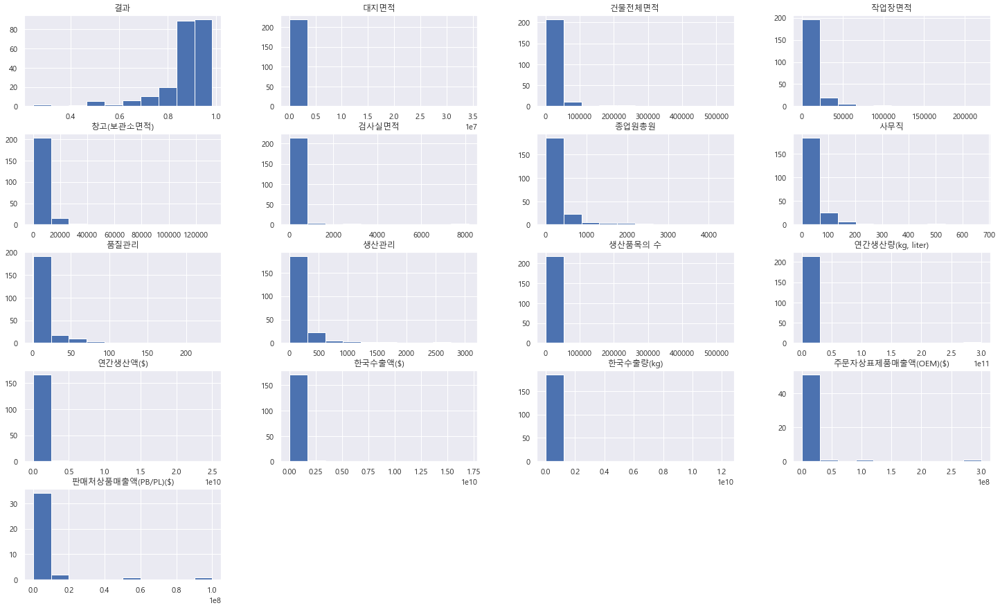

In [462]:
for col in df.columns[df.dtypes == 'object']:
    df[col] = df[col].astype('category')

df.hist(figsize=(25, 15))

## 결측치는 mode로 대체

국가                     0.000000
성,도시                   1.777778
제조업소명                  0.000000
소재지                    0.000000
해외제조업소코드               0.000000
식품유형                   0.000000
세부유형                  30.222222
결과                     0.000000
판정결과                   0.000000
업소위치                   0.444444
작업장 연수                 0.000000
대지면적                   1.777778
건물전체면적                 0.444444
작업장면적                  0.444444
창고(보관소면적)              0.444444
검사실면적                  0.444444
건물소유구분                 0.444444
종업원총원                  0.444444
사무직                    0.444444
품질관리                   0.444444
생산관리                   0.444444
생산품목의 수                2.666667
연간생산량(kg, liter)       3.111111
연간생산액($)              24.888889
주요수출국                  0.888889
한국수출액($)              22.666667
한국수출량(kg)             17.333333
주문자상표제품매출액(OEM)($)    76.000000
판매처상품매출액(PB/PL)($)    83.111111
dtype: float64

<AxesSubplot:>

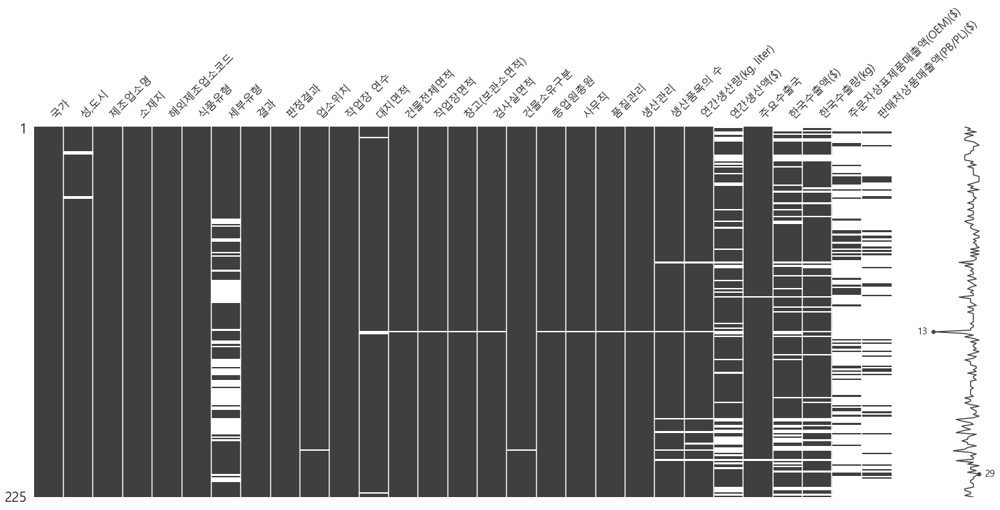

In [473]:
import missingno as msn
msn.matrix(df)

## 결측치 30%이상 컬럼은 데이터에서 제거

In [490]:
missratio = df.isnull().sum()/len(df)*100
missratio.sort_values(ascending=False)
missratio[missratio > 30].index

판매처상품매출액(PB/PL)($)    83.111111
주문자상표제품매출액(OEM)($)    76.000000
세부유형                  30.222222
연간생산액($)              24.888889
한국수출액($)              22.666667
한국수출량(kg)             17.333333
연간생산량(kg, liter)       3.111111
생산품목의 수                2.666667
대지면적                   1.777778
성,도시                   1.777778
주요수출국                  0.888889
건물소유구분                 0.444444
생산관리                   0.444444
품질관리                   0.444444
사무직                    0.444444
종업원총원                  0.444444
창고(보관소면적)              0.444444
검사실면적                  0.444444
작업장면적                  0.444444
건물전체면적                 0.444444
업소위치                   0.444444
작업장 연수                 0.000000
판정결과                   0.000000
결과                     0.000000
식품유형                   0.000000
해외제조업소코드               0.000000
소재지                    0.000000
제조업소명                  0.000000
국가                     0.000000
dtype: float64

Index(['세부유형', '주문자상표제품매출액(OEM)($)', '판매처상품매출액(PB/PL)($)'], dtype='object')

In [492]:
df.drop(list(missratio[missratio > 30].index), axis=1, inplace=True)

<AxesSubplot:>

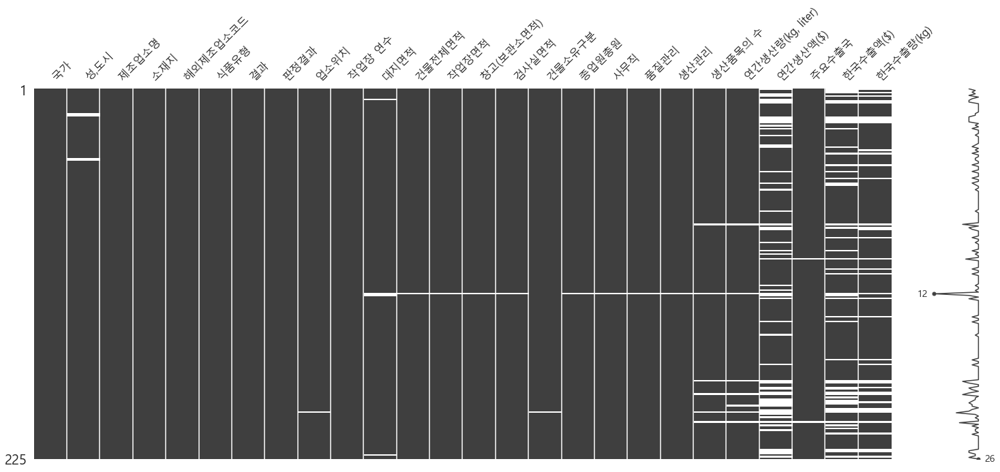

In [494]:
msn.matrix(df)

In [496]:
df.columns

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '결과', '판정결과', '업소위치',
       '작업장 연수', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '건물소유구분',
       '종업원총원', '사무직', '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)',
       '연간생산액($)', '주요수출국', '한국수출액($)', '한국수출량(kg)'],
      dtype='object')

## 결측치 대체, 실수형은 mean 범주형은 mode

<AxesSubplot:>

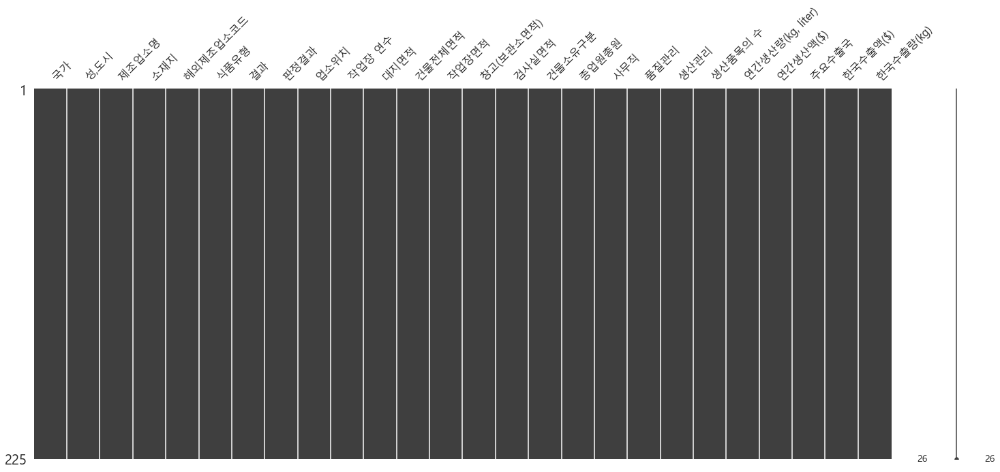

In [531]:
for col in df.columns :
    if df[col].dtype == 'float':
        df[col] = df[col].fillna(df[col].mean())
        df[col] = np.log(df[col])
        
    elif df[col].dtype == 'category':
        df[col] = df[col].fillna(df[col].mode()[0])
        
msn.matrix(df)

array([[<AxesSubplot:title={'center':'결과'}>,
        <AxesSubplot:title={'center':'대지면적'}>,
        <AxesSubplot:title={'center':'건물전체면적'}>,
        <AxesSubplot:title={'center':'작업장면적'}>],
       [<AxesSubplot:title={'center':'창고(보관소면적)'}>,
        <AxesSubplot:title={'center':'검사실면적'}>,
        <AxesSubplot:title={'center':'종업원총원'}>,
        <AxesSubplot:title={'center':'사무직'}>],
       [<AxesSubplot:title={'center':'품질관리'}>,
        <AxesSubplot:title={'center':'생산관리'}>,
        <AxesSubplot:title={'center':'생산품목의 수'}>,
        <AxesSubplot:title={'center':'연간생산량(kg, liter)'}>],
       [<AxesSubplot:title={'center':'연간생산액($)'}>,
        <AxesSubplot:title={'center':'한국수출액($)'}>,
        <AxesSubplot:title={'center':'한국수출량(kg)'}>, <AxesSubplot:>]],
      dtype=object)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


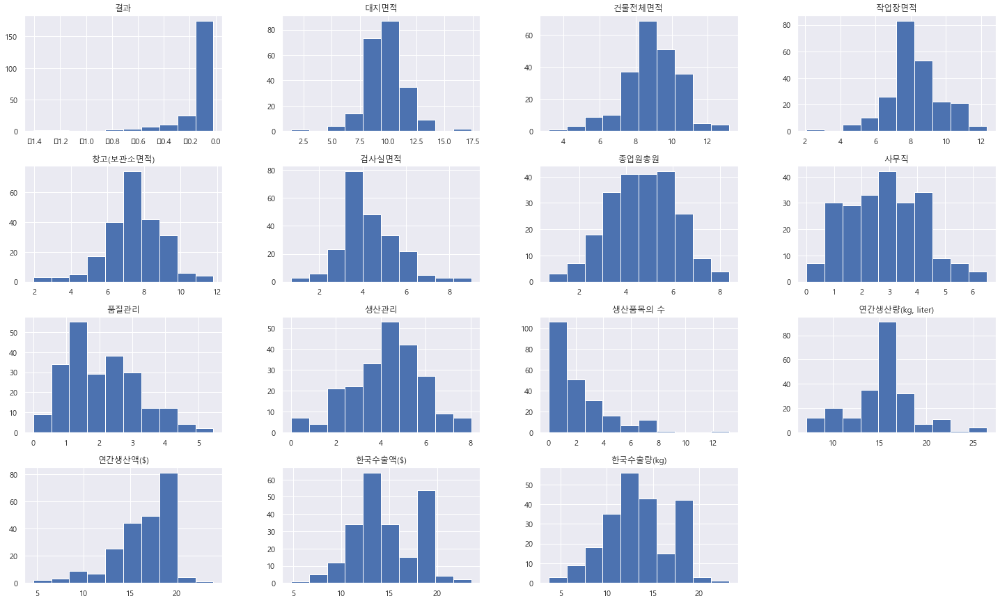

In [532]:
df.hist(figsize=(25, 15))

In [422]:
for col in df:
    if df[col].nunique() < 20:
        print(col)

판정결과
업소위치
건물소유구분


# EDA

In [7]:
sns.boxplot(x ='업소위치', y = "생산품목의 수",  hue = "판정결과", palette = "Set3", data = df); plt.show()
sns.boxplot(x ='건물소유구분', y = "생산품목의 수",  hue = "판정결과", palette = "Set3", data = df)

TypeError: Neither the `x` nor `y` variable appears to be numeric.

In [550]:
list(df.columns[df.dtypes == 'float'])
cols = ['결과',
 '대지면적',
 '건물전체면적',
 '작업장면적',
 '창고(보관소면적)',
 '검사실면적',
 '종업원총원',
 '사무직',
 '품질관리',
 '생산관리',
 '생산품목의 수',
 '연간생산량(kg, liter)',
 '연간생산액($)',
 '한국수출액($)',
 '한국수출량(kg)', '판정결과']

['결과',
 '대지면적',
 '건물전체면적',
 '작업장면적',
 '창고(보관소면적)',
 '검사실면적',
 '종업원총원',
 '사무직',
 '품질관리',
 '생산관리',
 '생산품목의 수',
 '연간생산량(kg, liter)',
 '연간생산액($)',
 '한국수출액($)',
 '한국수출량(kg)']

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


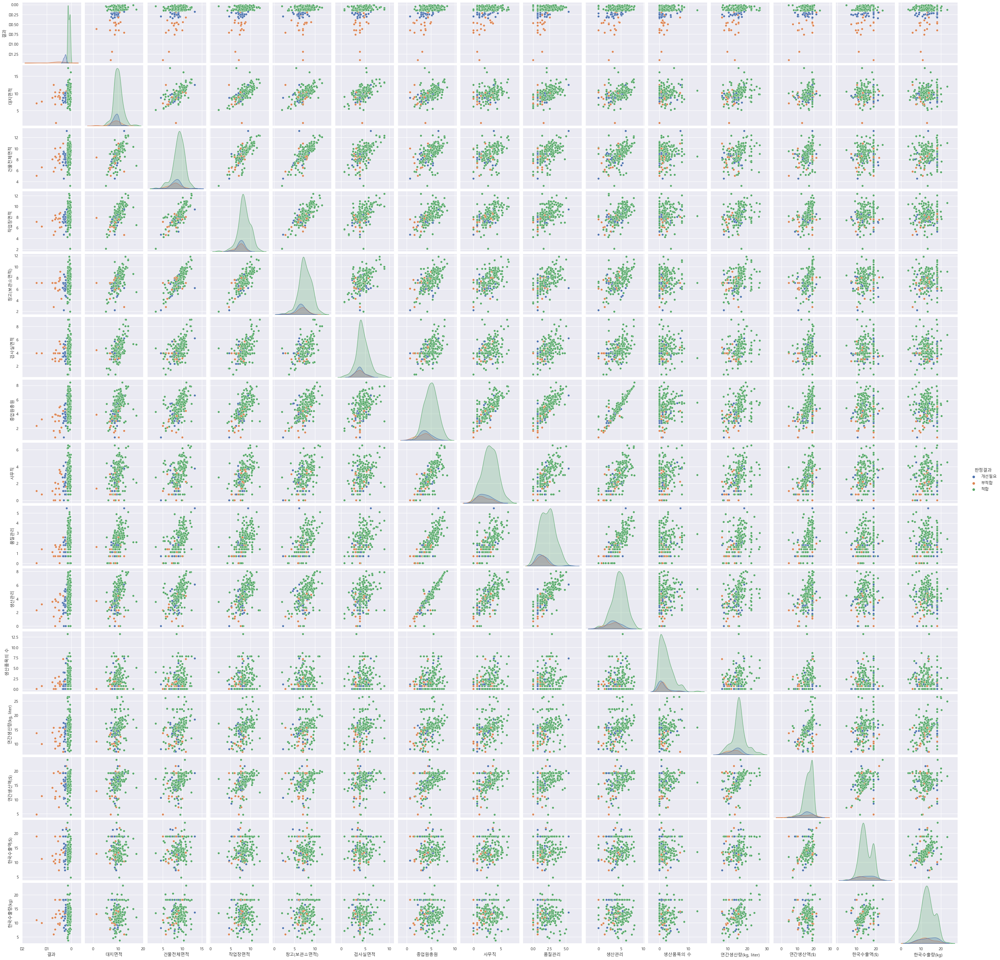

In [551]:
sns.pairplot(df[cols], hue='판정결과')

In [557]:
import plotly.express as px
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [552]:
data =df.copy()

#  Categorical variables correlations
- https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9

- https://www.kaggle.com/shakedzy/alone-in-the-woods-using-theil-s-u-for-survival

- https://pydataset.readthedocs.io/en/latest/_modules/dataset/correlations.html 

In [5]:
import math
import scipy.stats as ss
from collections import Counter

def conditional_entropy(x,y):
    # entropy of x given y
    y_counter = Counter(y)
    xy_counter = Counter(list(zip(x,y)))
    total_occurrences = sum(y_counter.values())
    entropy = 0
    for xy in xy_counter.keys():
        p_xy = xy_counter[xy] / total_occurrences
        p_y = y_counter[xy[1]] / total_occurrences
        entropy += p_xy * math.log(p_y/p_xy)
    return entropy

def theil_u(x,y):
    s_xy = conditional_entropy(x,y)
    x_counter = Counter(x)
    total_occurrences = sum(x_counter.values())
    p_x = list(map(lambda n: n/total_occurrences, x_counter.values()))
    s_x = ss.entropy(p_x)
    if s_x == 0:
        return 1
    else:
        return (s_x - s_xy) / s_x

In [9]:
columns = data.columns

theilu = pd.DataFrame(index=['판정결과'], columns= columns)


def cat_corr (df):
    for j in range(0,len(columns)):
        u = theil_u(df['판정결과'].tolist(),df[columns[j]].tolist())
        theilu.loc[:,columns[j]] = u
    theilu.fillna(value=np.nan,inplace=True)

    plt.figure(figsize=(30,2))
    sns.heatmap(theilu,annot=True,fmt='.2f')

    plt.show()

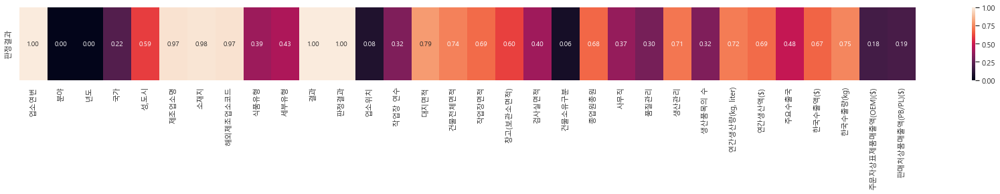

In [10]:
cat_corr(data)

<AxesSubplot:>

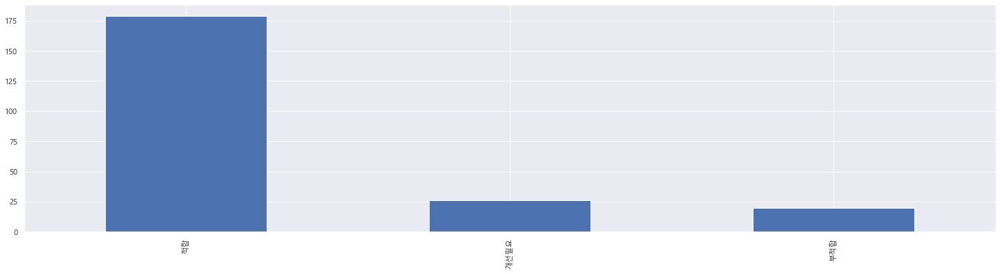

In [554]:
data['판정결과'].value_counts().plot(kind='bar')

In [573]:
fig = px.scatter(data, x="국가", y="연간생산량(kg, liter)", color="판정결과",size="한국수출액($)")
fig.update_layout(title='국가별 과세가격과 생산량(log)',
                  xaxis_title="국가",yaxis_title="연간생산량(kg, liter)")

In [580]:
df.columns[df.dtypes =='category']
df.columns[df.dtypes =='float']

for col in df:
    if df[col].nunique() < 20:
        print(col)
        df[col].nunique()

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '판정결과', '업소위치',
       '작업장 연수', '건물소유구분', '주요수출국'],
      dtype='object')

Index(['결과', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '종업원총원', '사무직',
       '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '한국수출액($)',
       '한국수출량(kg)'],
      dtype='object')

판정결과


3

업소위치


8

건물소유구분


4

판정결과
개선필요    AxesSubplot(0.125,0.551739;0.344444x0.328261)
부적합     AxesSubplot(0.125,0.551739;0.344444x0.328261)
적합      AxesSubplot(0.125,0.551739;0.344444x0.328261)
Name: 건물전체면적, dtype: object

판정결과
개선필요    AxesSubplot(0.555556,0.551739;0.344444x0.328261)
부적합     AxesSubplot(0.555556,0.551739;0.344444x0.328261)
적합      AxesSubplot(0.555556,0.551739;0.344444x0.328261)
Name: 검사실면적, dtype: object

판정결과
개선필요    AxesSubplot(0.125,0.125;0.344444x0.328261)
부적합     AxesSubplot(0.125,0.125;0.344444x0.328261)
적합      AxesSubplot(0.125,0.125;0.344444x0.328261)
Name: 종업원총원, dtype: object

판정결과
개선필요    AxesSubplot(0.555556,0.125;0.344444x0.328261)
부적합     AxesSubplot(0.555556,0.125;0.344444x0.328261)
적합      AxesSubplot(0.555556,0.125;0.344444x0.328261)
Name: 한국수출량(kg), dtype: object

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning:

Glyph 8722 missing from current font.

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning:

Glyph 8722 missing from current font.



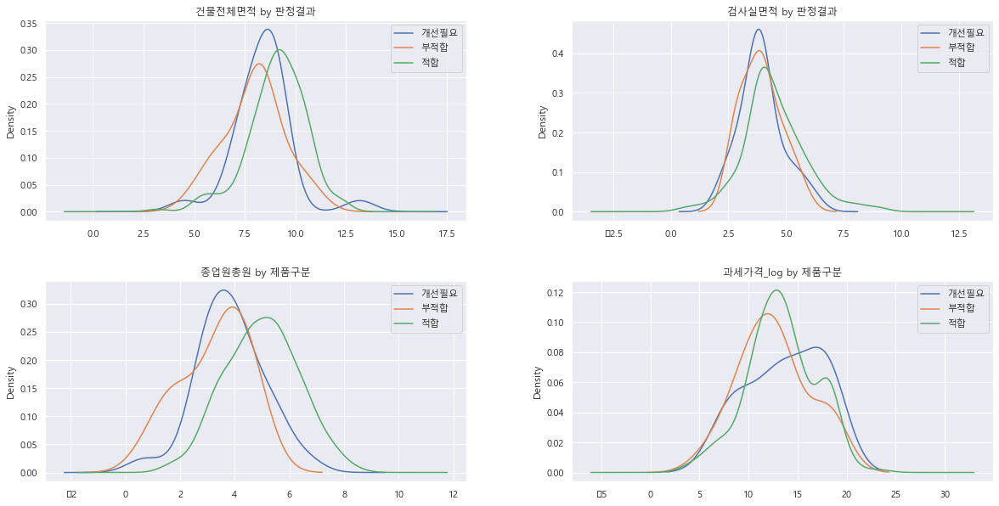

In [578]:
f, axes = plt.subplots(2, 2, figsize=(20, 10))
f.subplots_adjust(hspace=.3, wspace=.25)
data.groupby('판정결과')['건물전체면적'].plot(kind='kde', ax=axes[0][0], legend=True, title='건물전체면적 by 판정결과')
data.groupby('판정결과')['검사실면적'].plot(kind='kde', ax=axes[0][1], legend=True, title='검사실면적 by 판정결과')
data.groupby('판정결과')['종업원총원'].plot(kind='kde', ax=axes[1][0], legend=True, title='종업원총원 by 제품구분')
data.groupby('판정결과')['한국수출량(kg)'].plot(kind='kde', ax=axes[1][1], legend=True, title='과세가격_log by 제품구분')

In [580]:
df.columns[df.dtypes =='category']
df.columns[df.dtypes =='float']

for col in df:
    if df[col].nunique() < 20:
        print(col)
        df[col].nunique()

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '판정결과', '업소위치',
       '작업장 연수', '건물소유구분', '주요수출국'],
      dtype='object')

Index(['결과', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '종업원총원', '사무직',
       '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '한국수출액($)',
       '한국수출량(kg)'],
      dtype='object')

판정결과


3

업소위치


8

건물소유구분


4

In [579]:
import ptitprince as pt

Text(0.5, 1.0, '판정결과와 연간생산량(kg, liter)')

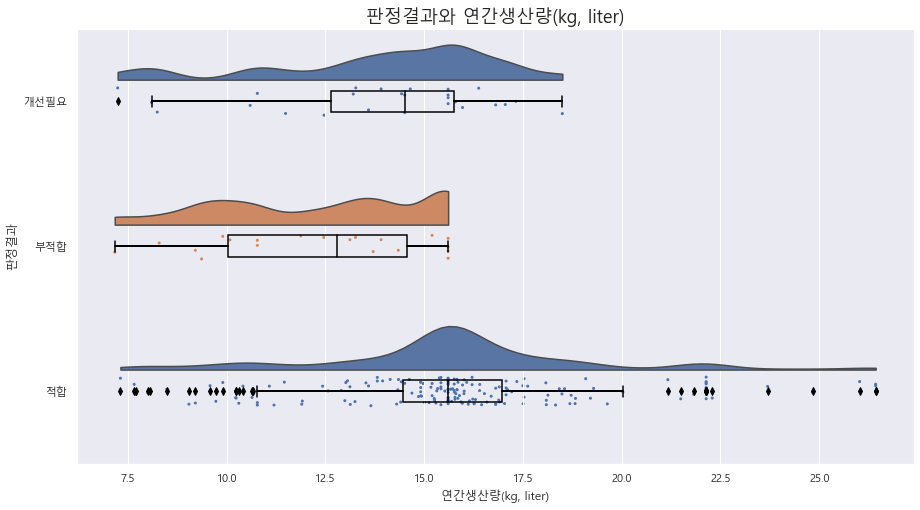

In [583]:
# plotting the clouds
f, ax = plt.subplots(figsize=(15, 8))
dy="판정결과"; dx="연간생산량(kg, liter)"; ort="h"; pal = sns.color_palette(n_colors=2)

ax=pt.half_violinplot( x = dx, y = dy, data = data, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)
ax=sns.stripplot( x = dx, y = dy, data = data, palette = pal, edgecolor = "white",
                 size = 3, jitter = 1, zorder = 0, orient = ort, ax = ax )
ax=sns.boxplot( x = dx, y = dy, data = data, color = "black", width = .15, zorder = 10,\
            showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
            showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
               saturation = 1, orient = ort)

plt.title("판정결과와 연간생산량(kg, liter)", fontsize=18)

Text(0.5, 1.0, '판정결과와 생산품목의 수')

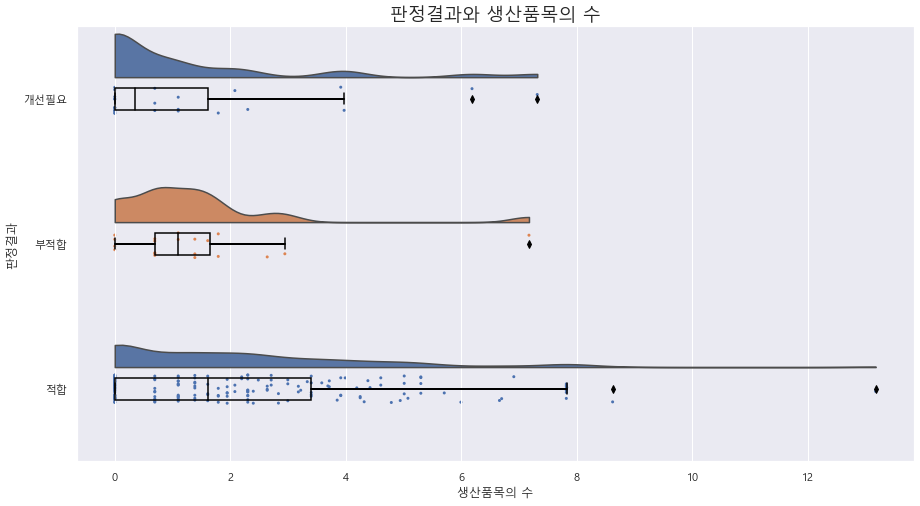

In [584]:
# plotting the clouds
f, ax = plt.subplots(figsize=(15, 8))
dy="판정결과"; dx="생산품목의 수"; ort="h"; pal = sns.color_palette(n_colors=2)

ax=pt.half_violinplot( x = dx, y = dy, data = data, palette = pal, bw = .2, cut = 0.,
                      scale = "area", width = .6, inner = None, orient = ort)
ax=sns.stripplot( x = dx, y = dy, data = data, palette = pal, edgecolor = "white",
                 size = 3, jitter = 1, zorder = 0, orient = ort, ax = ax )
ax=sns.boxplot( x = dx, y = dy, data = data, color = "black", width = .15, zorder = 10,\
            showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
            showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
               saturation = 1, orient = ort)

plt.title("판정결과와 생산품목의 수", fontsize=18)

In [580]:
df.columns[df.dtypes =='category']
df.columns[df.dtypes =='float']

for col in df:
    if df[col].nunique() < 20:
        print(col)
        df[col].nunique()

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '판정결과', '업소위치',
       '작업장 연수', '건물소유구분', '주요수출국'],
      dtype='object')

Index(['결과', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '종업원총원', '사무직',
       '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '한국수출액($)',
       '한국수출량(kg)'],
      dtype='object')

판정결과


3

업소위치


8

건물소유구분


4

<AxesSubplot:>

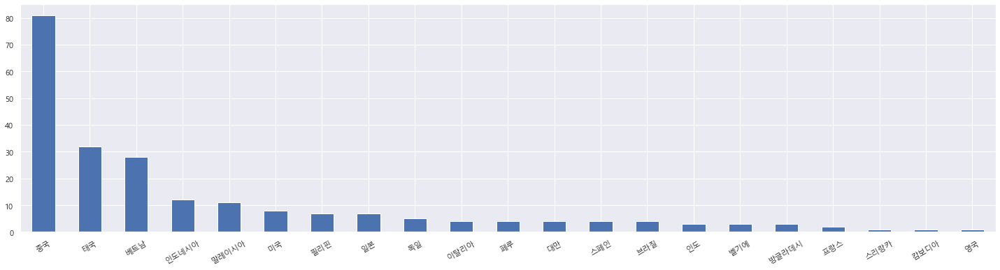

In [590]:
data.국가.value_counts().plot(kind='bar', rot=30)

In [598]:
data.groupby(['식품유형', '국가']).count()

성,도시  제조업소명  소재지  해외제조업소코드  결과  판정결과  업소위치  작업장 연수  \
식품유형             국가                                                          
 다류              대만        1      1    1         1   1     1     1       1   
                 독일        0      0    0         0   0     0     0       0   
                 말레이시아     0      0    0         0   0     0     0       0   
                 미국        0      0    0         0   0     0     0       0   
                 방글라데시     0      0    0         0   0     0     0       0   
...                      ...    ...  ...       ...  ..   ...   ...     ...   
향신료가공품, 기타농산가공품류 캄보디아      0      0    0         0   0     0     0       0   
                 태국        0      0    0         0   0     0     0       0   
                 페루        0      0    0         0   0     0     0       0   
                 프랑스       0      0    0         0   0     0     0       0   
                 필리핀       0      0    0         0   0     0     0       0   

                        대지면적  건물전체면적  ...  사무직  품질관리  생산관리  생산품목의 수  \
식품유형             국가                   ...                             
 다류              대만        1       1  ...    1     1     1        1   
                 독일        0       0  ...    0     0     0        0   
                 말레이시아     0       0  ...    0     0     0        0   
                 미국        0       0  ...    0     0     0        0   
                 방글라데시     0       0  ...    0     0     0        0   
...                      ...     ...  ...  ...   ...   ...      ...   
향신료가공품, 기타농산가공품류 캄보디아      0       0  ...    0     0     0        0   
                 태국        0       0  ...    0     0     0        0   
                 페루        0       0  ...    0     0     0        0   
                 프랑스       0       0  ...    0     0     0        0   
                 필리핀       0       0  ...    0     0     0        0   

                        연간생산량(kg, liter)  연간생산액($)  주요수출국  한국수출액($)  \
식품유형             국가                                                   
 다류              대만                    1         1      1         1   
                 독일                    0         0      0         0   
                 말레이시아                 0         0      0         0   
                 미국                    0         0      0         0   
                 방글라데시                 0         0      0         0   
...                                  ...       ...    ...       ...   
향신료가공품, 기타농산가공품류 캄보디아                  0         0      0         0   
                 태국                    0         0      0         0   
                 페루                    0         0      0         0   
                 프랑스                   0         0      0         0   
                 필리핀                   0         0      0         0   

                        한국수출량(kg)  건수  
식품유형             국가                    
 다류              대만             1   1  
                 독일             0   0  
                 말레이시아          0   0  
                 미국             0   0  
                 방글라데시          0   0  
...                           ...  ..  
향신료가공품, 기타농산가공품류 캄보디아           0   0  
                 태국             0   0  
                 페루             0   0  
                 프랑스            0   0  
                 필리핀            0   0  

[1365 rows x 25 columns]

<AxesSubplot:>

Text(0.5, 1.0, ' 다류_국가')

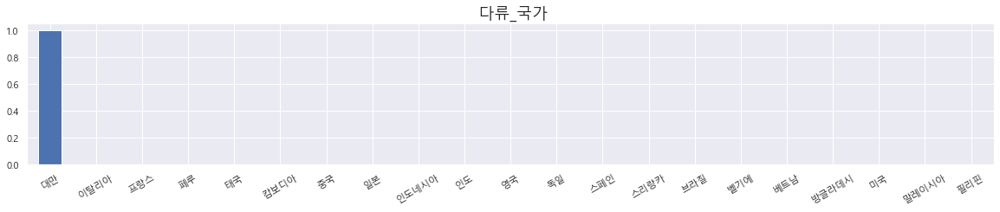

<AxesSubplot:>

Text(0.5, 1.0, '(1)가르시니아캄보지아 추출물\n(2) 영양성분\n(3) 녹차추출물_국가')

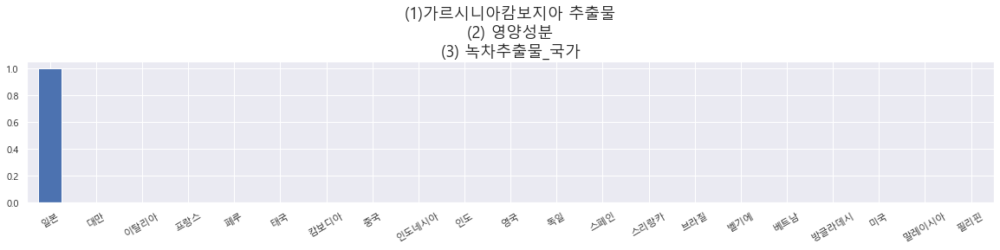

<AxesSubplot:>

Text(0.5, 1.0, '건강기능식품_국가')

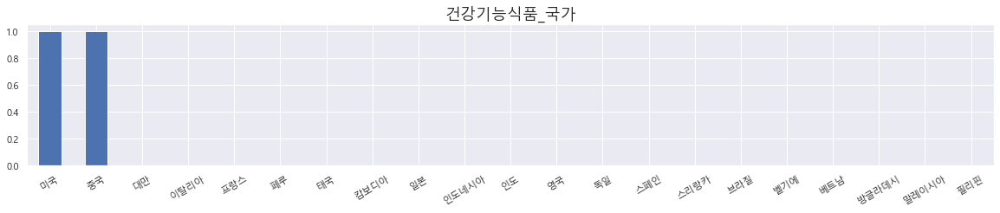

<AxesSubplot:>

Text(0.5, 1.0, '건포류_국가')

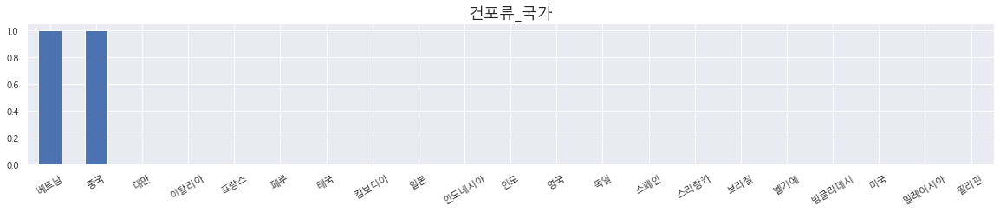

<AxesSubplot:>

Text(0.5, 1.0, '과실주_국가')

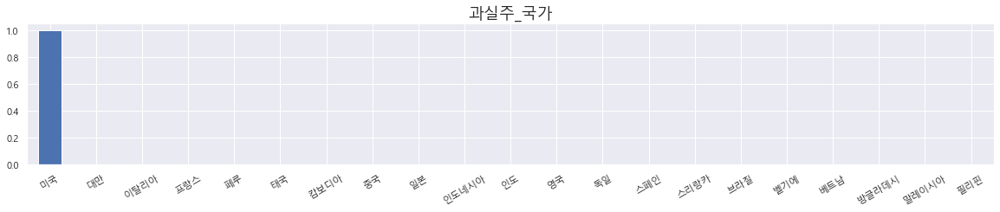

<AxesSubplot:>

Text(0.5, 1.0, '과일·채소류 음료_국가')

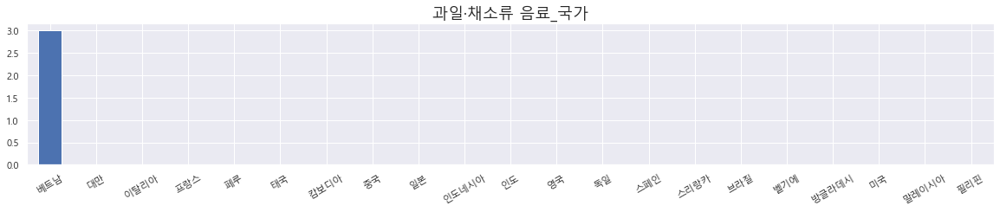

<AxesSubplot:>

Text(0.5, 1.0, '과일·채소류음료_국가')

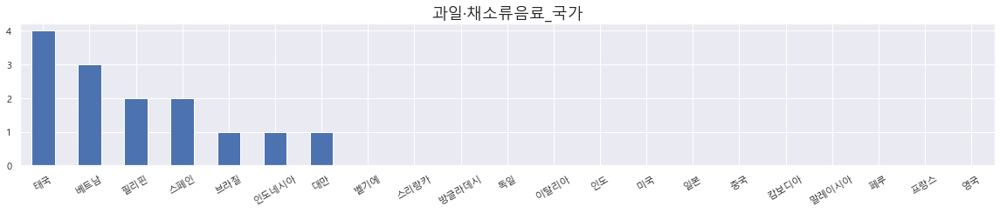

<AxesSubplot:>

Text(0.5, 1.0, '과일·채소류음료, 기타농산가공품류_국가')

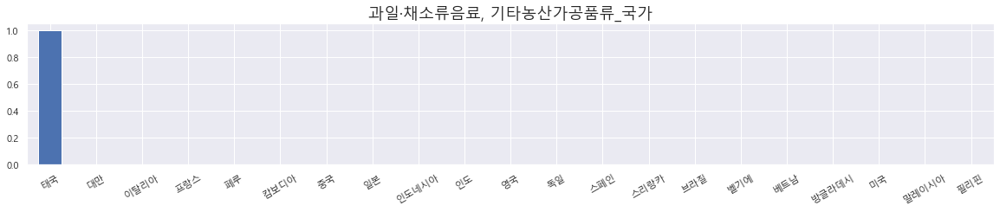

<AxesSubplot:>

Text(0.5, 1.0, '과일․채소류음료_국가')

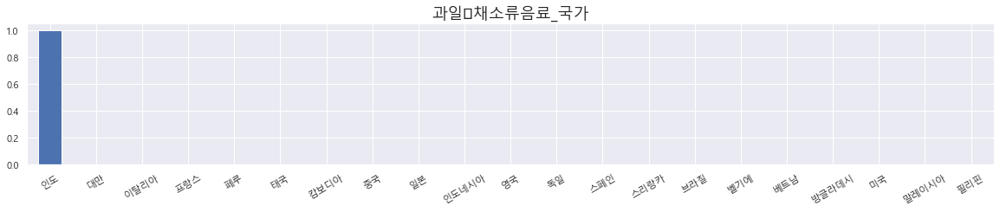

<AxesSubplot:>

Text(0.5, 1.0, '과자류, 빵류 또는 떡류_국가')

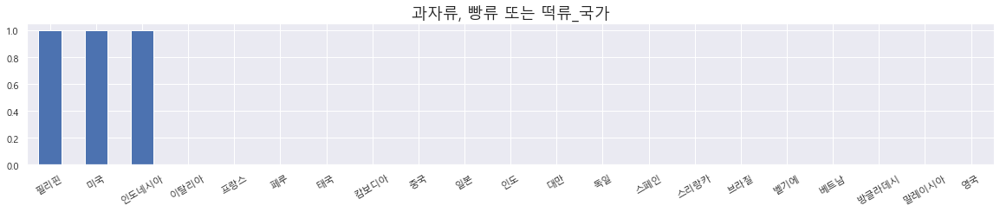

<AxesSubplot:>

Text(0.5, 1.0, '과자류,빵류, 또는 떡류(캔디류)_국가')

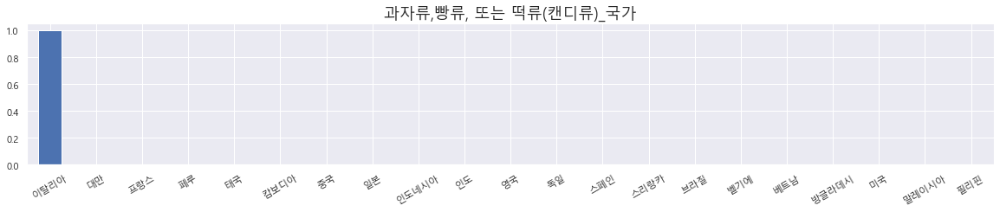

<AxesSubplot:>

Text(0.5, 1.0, '과자류,빵류또는떡류_국가')

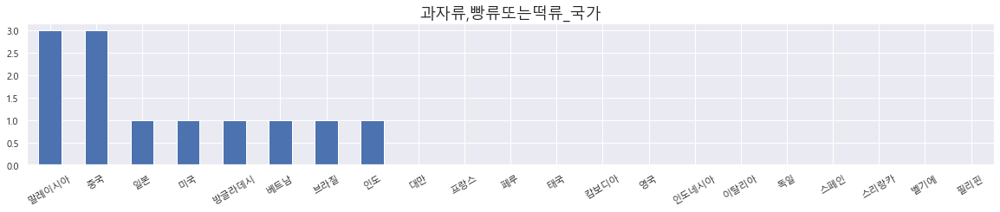

<AxesSubplot:>

Text(0.5, 1.0, '과자류,빵류또는떡류, 초콜릿류_국가')

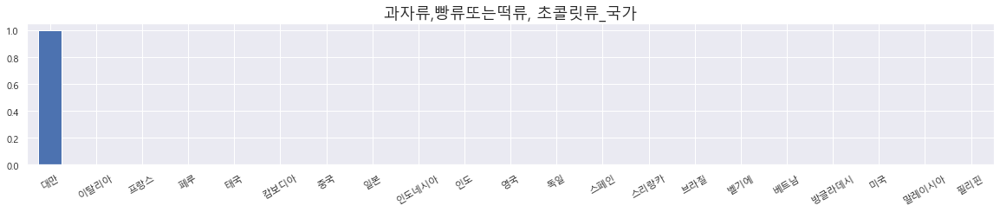

<AxesSubplot:>

Text(0.5, 1.0, '과자류․빵류또는떡류, 향신료가공품, 카레_국가')

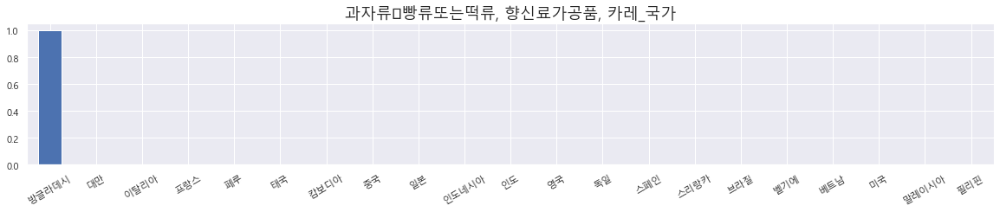

<AxesSubplot:>

Text(0.5, 1.0, '과채가공품_국가')

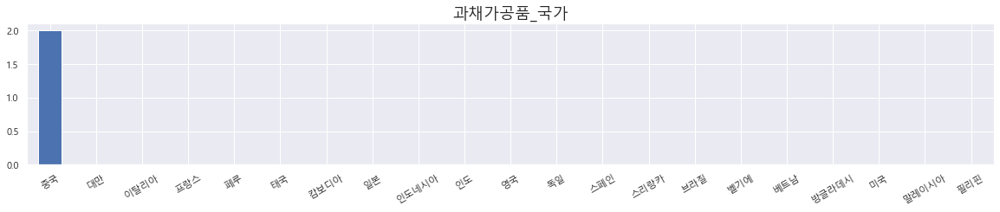

<AxesSubplot:>

Text(0.5, 1.0, '과채가공품, 기타가공품_국가')

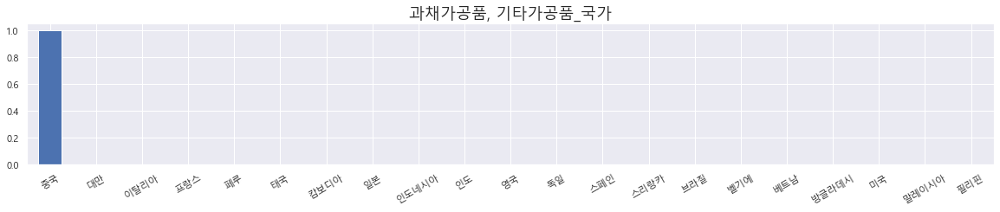

<AxesSubplot:>

Text(0.5, 1.0, '과채가공품, 두류가공품, 서류가공품_국가')

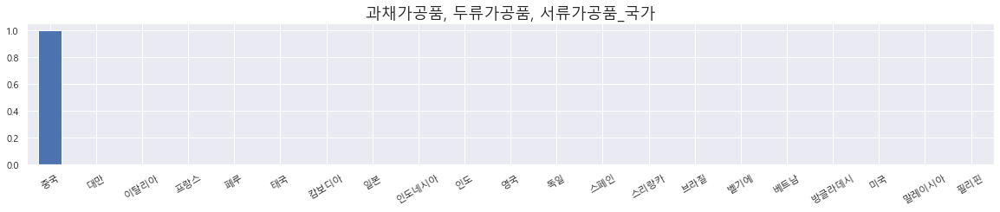

<AxesSubplot:>

Text(0.5, 1.0, '기구류_국가')

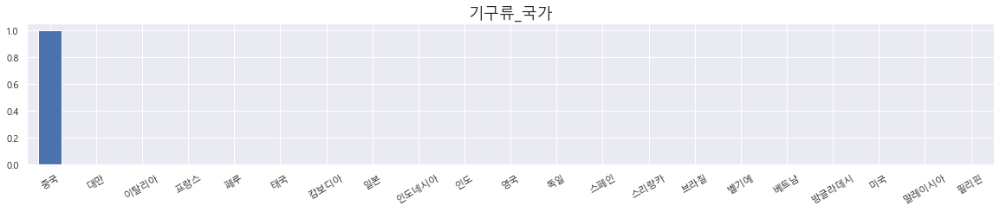

<AxesSubplot:>

Text(0.5, 1.0, '기타 농산가공품류_국가')

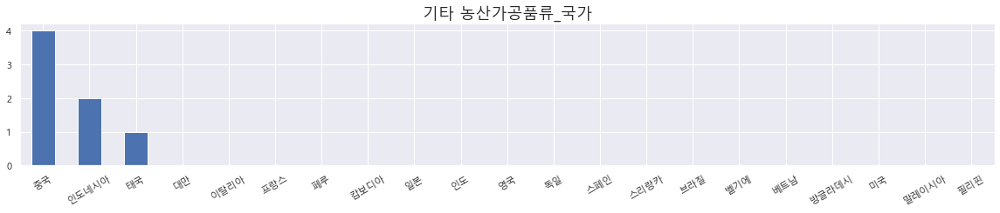

<AxesSubplot:>

Text(0.5, 1.0, '기타 농산물가공품류_국가')

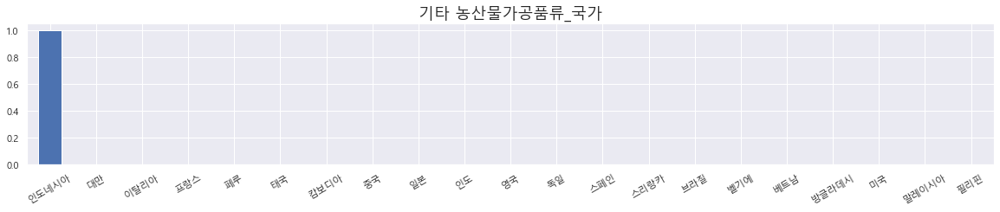

<AxesSubplot:>

Text(0.5, 1.0, '기타 농산물가공품류, 기타 수산물가공품_국가')

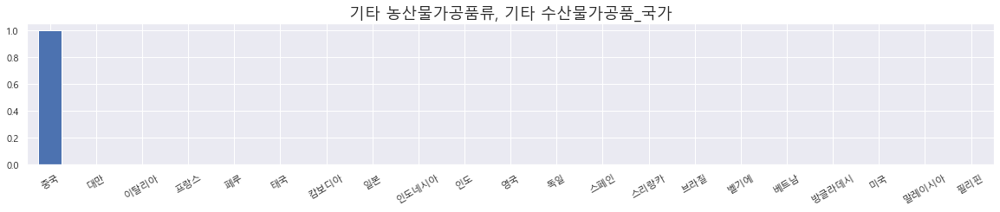

<AxesSubplot:>

Text(0.5, 1.0, '기타 농산물가공품류, 다류_국가')

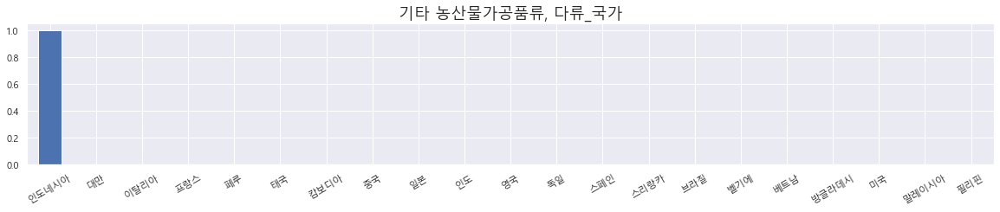

<AxesSubplot:>

Text(0.5, 1.0, '기타 수산물가공품_국가')

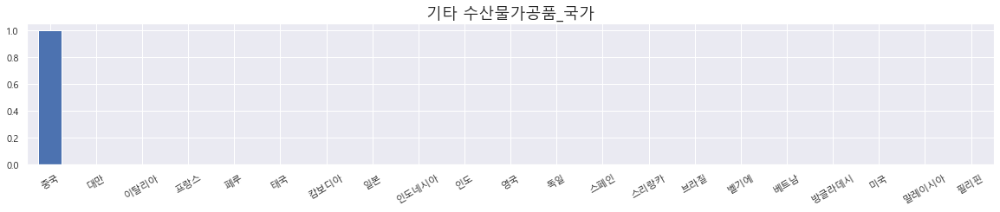

<AxesSubplot:>

Text(0.5, 1.0, '기타가공품_국가')

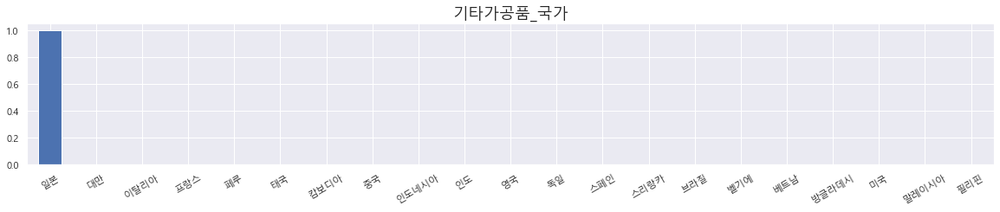

<AxesSubplot:>

Text(0.5, 1.0, '기타농산가공품류_국가')

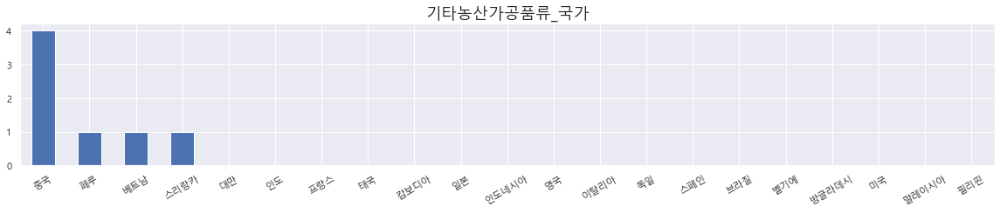

<AxesSubplot:>

Text(0.5, 1.0, '기타농산가공품류, 과일·채소류음료_국가')

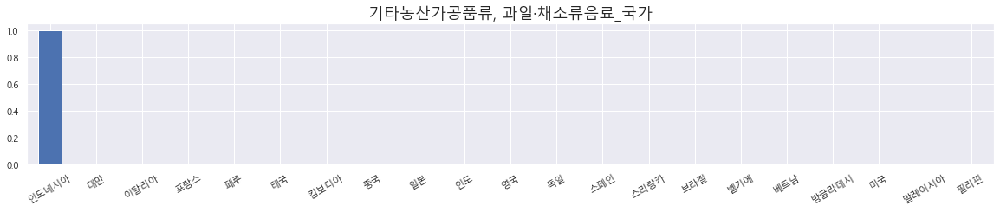

<AxesSubplot:>

Text(0.5, 1.0, '기타농산가공품류, 절임류_국가')

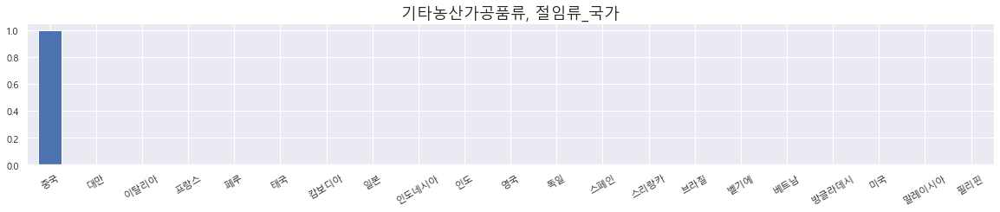

<AxesSubplot:>

Text(0.5, 1.0, '기타음료, 커피_국가')

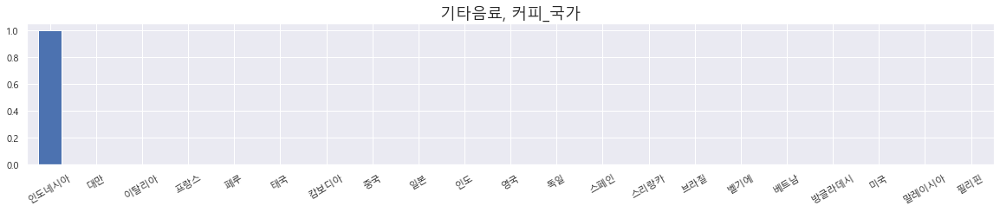

<AxesSubplot:>

Text(0.5, 1.0, '김치, 절임식품, 조림류, 향신료조제품_국가')

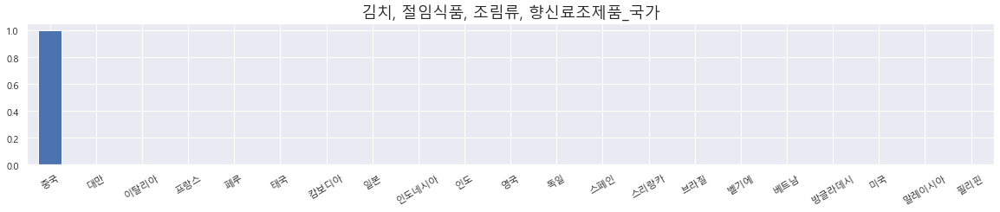

<AxesSubplot:>

Text(0.5, 1.0, '김치류_국가')

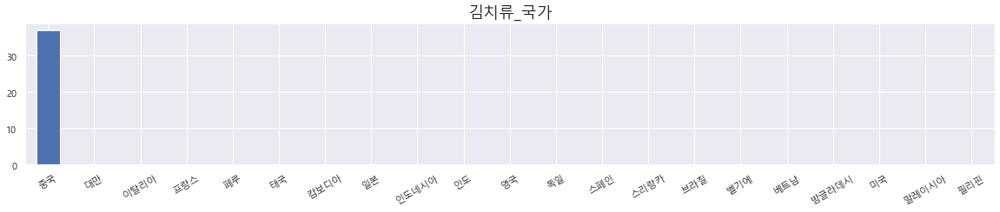

<AxesSubplot:>

Text(0.5, 1.0, '김치류, 절임류_국가')

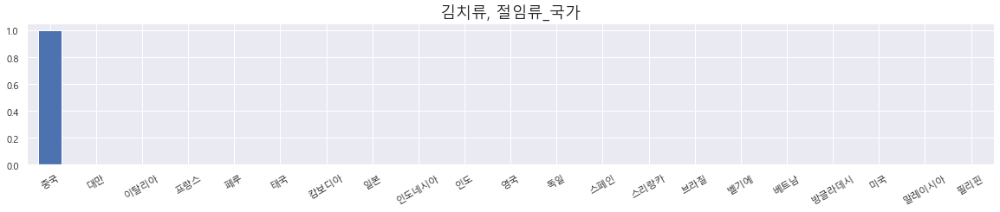

<AxesSubplot:>

Text(0.5, 1.0, '다류, 기타농산가공품류, 과일·채소류 음료_국가')

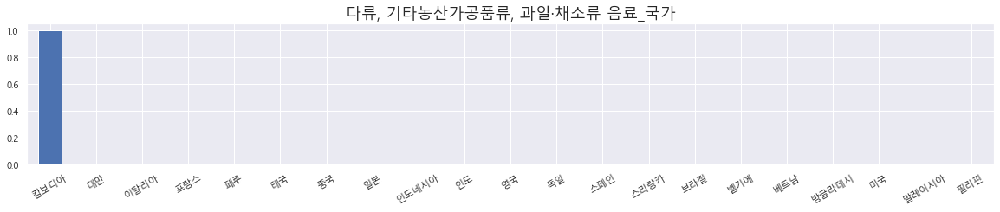

<AxesSubplot:>

Text(0.5, 1.0, '다류, 소스류_국가')

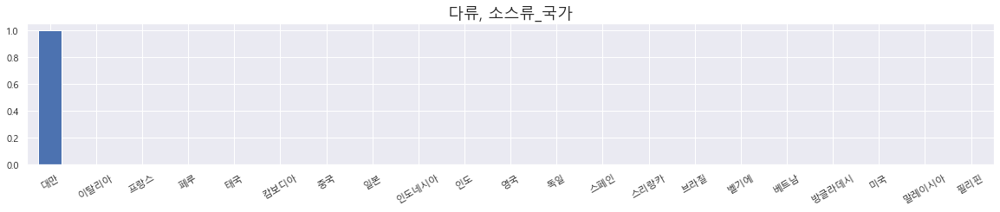

<AxesSubplot:>

Text(0.5, 1.0, '당류가공품, 식용유지가공품, 기타식품류_국가')

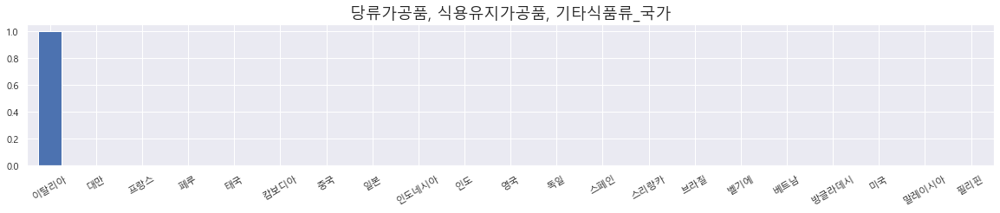

<AxesSubplot:>

Text(0.5, 1.0, '땅콩또는견과류가공품류_국가')

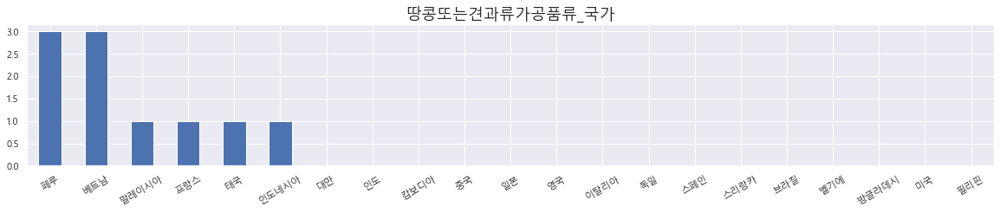

<AxesSubplot:>

Text(0.5, 1.0, '면류_국가')

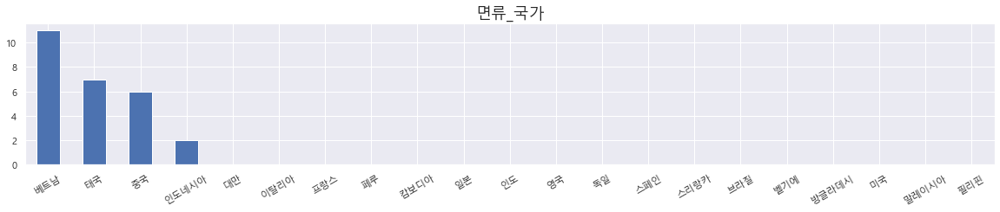

<AxesSubplot:>

Text(0.5, 1.0, '면류, 향신료가공품_국가')

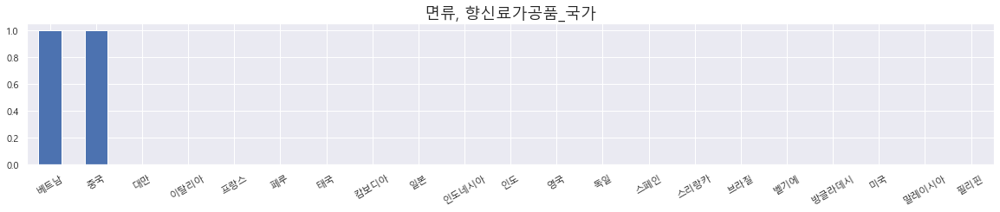

<AxesSubplot:>

Text(0.5, 1.0, '서류가공품_국가')

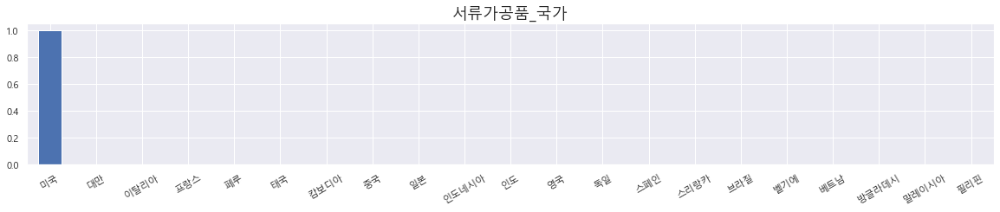

<AxesSubplot:>

Text(0.5, 1.0, '소스류_국가')

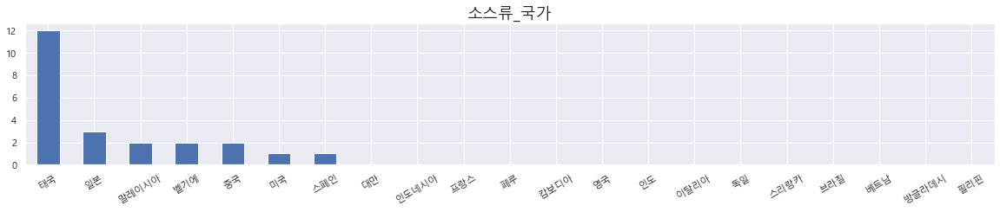

<AxesSubplot:>

Text(0.5, 1.0, '소스류(복합조미식품),카레, 향신료가공품(향신료조제품)_국가')

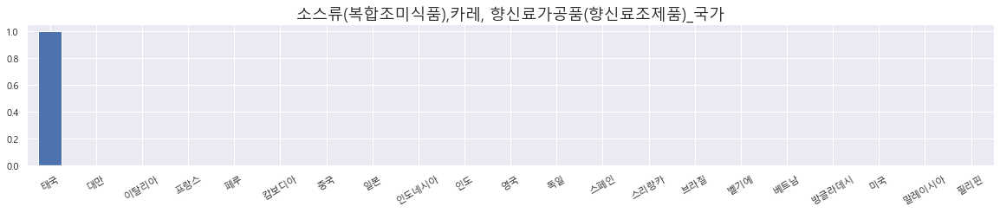

<AxesSubplot:>

Text(0.5, 1.0, '소스류, 기타 농산가공품류_국가')

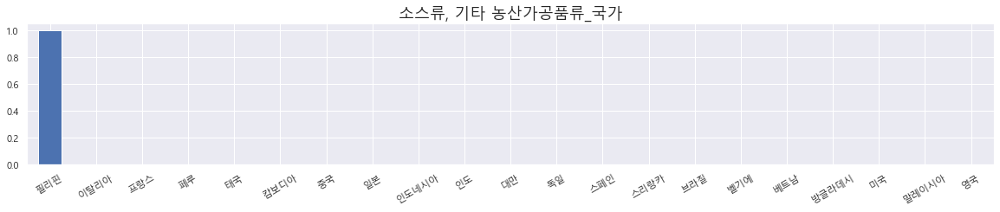

<AxesSubplot:>

Text(0.5, 1.0, '소스류, 식용유지가공품_국가')

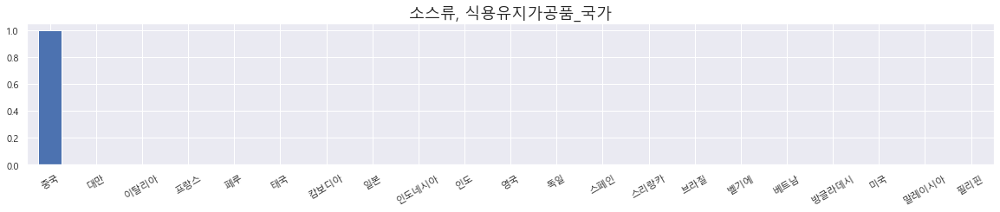

<AxesSubplot:>

Text(0.5, 1.0, '소스류, 장류_국가')

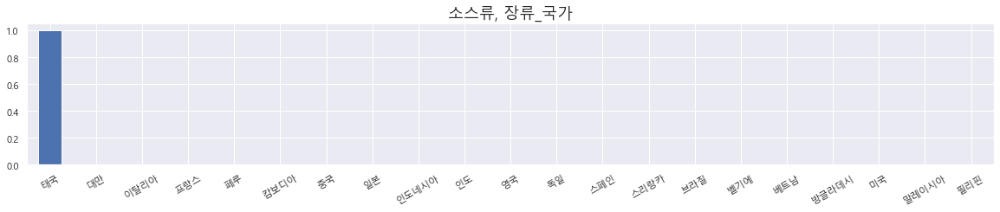

<AxesSubplot:>

Text(0.5, 1.0, '소스류, 젓갈류_국가')

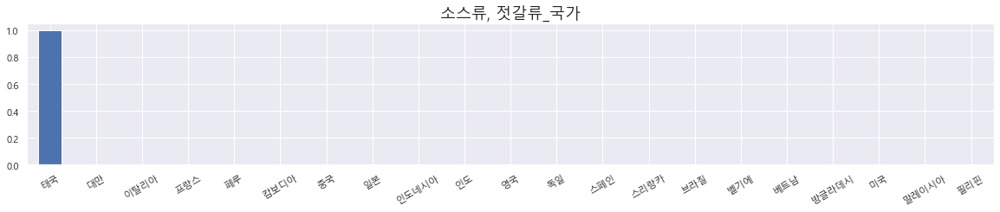

<AxesSubplot:>

Text(0.5, 1.0, '수산가공식품류_국가')

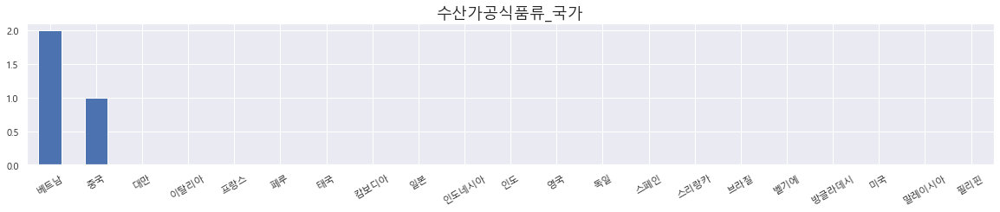

<AxesSubplot:>

Text(0.5, 1.0, '수산가공식품류, 과자류,빵류또는떡류_국가')

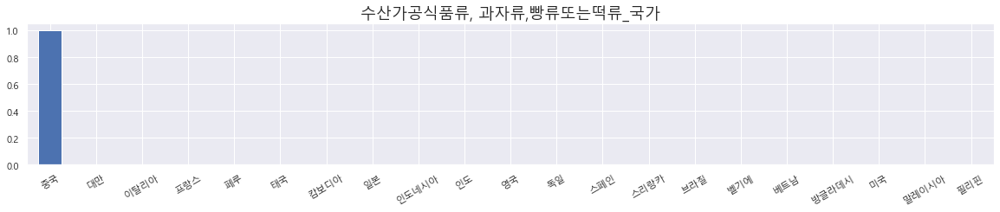

<AxesSubplot:>

Text(0.5, 1.0, '식물성유지류_국가')

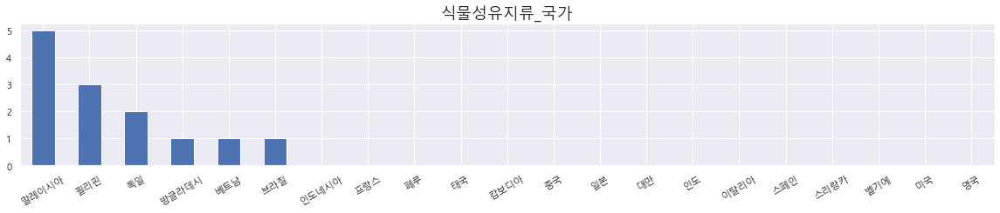

<AxesSubplot:>

Text(0.5, 1.0, '식물성유지류, 엿류_국가')

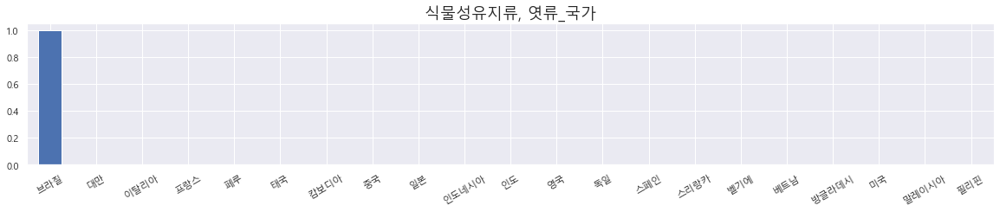

<AxesSubplot:>

Text(0.5, 1.0, '식용유지류_국가')

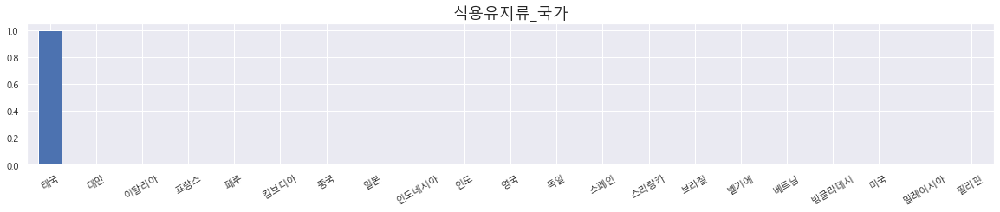

<AxesSubplot:>

Text(0.5, 1.0, '식용유지류, 기타가공품_국가')

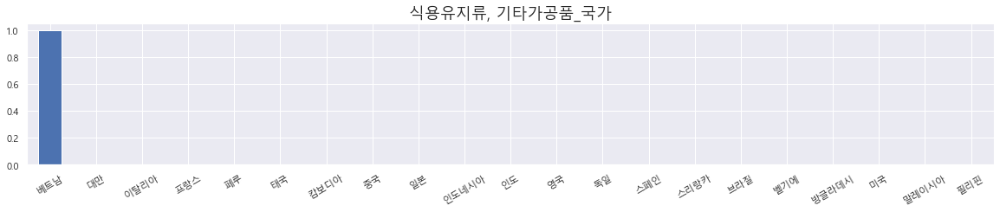

<AxesSubplot:>

Text(0.5, 1.0, '식초_국가')

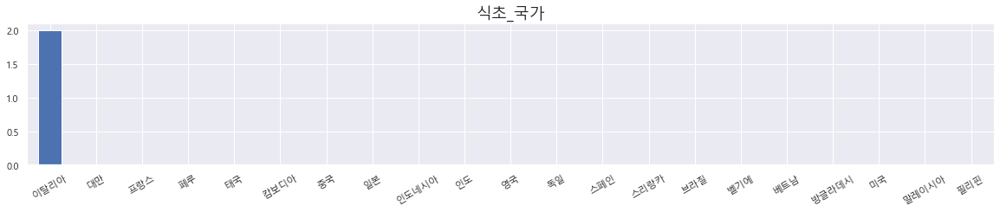

<AxesSubplot:>

Text(0.5, 1.0, '어육가공품류_국가')

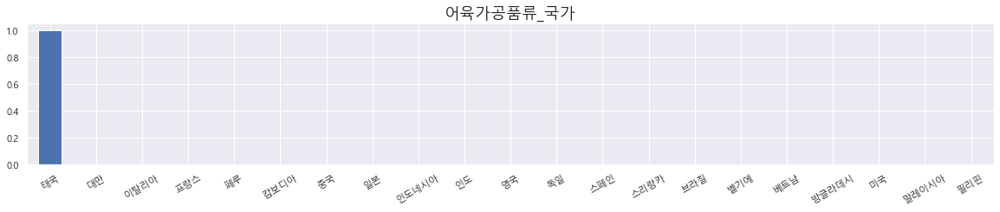

<AxesSubplot:>

Text(0.5, 1.0, '위스키_국가')

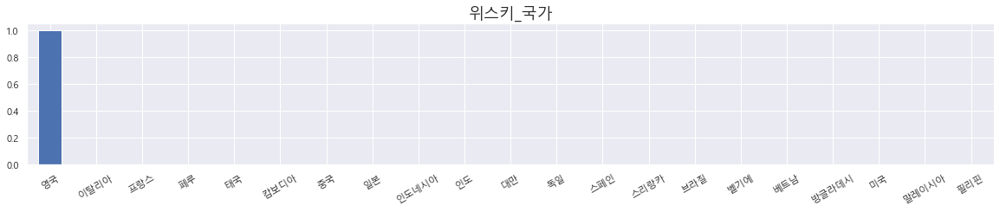

<AxesSubplot:>

Text(0.5, 1.0, '장류_국가')

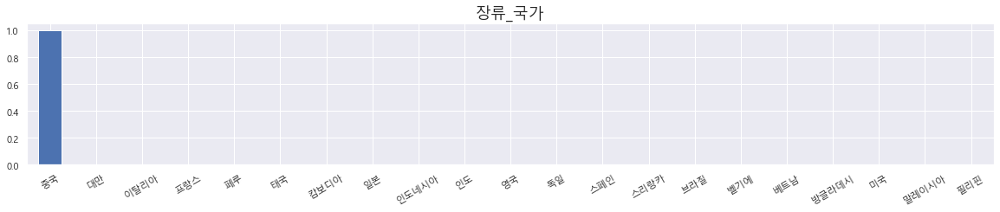

<AxesSubplot:>

Text(0.5, 1.0, '장류, 엿류_국가')

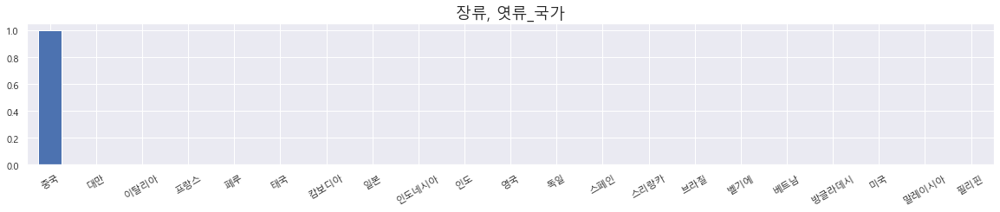

<AxesSubplot:>

Text(0.5, 1.0, '잼류_국가')

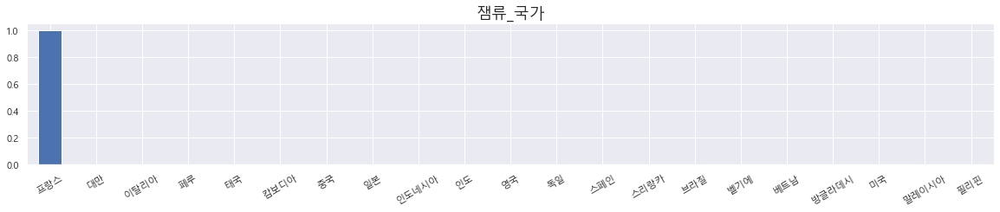

<AxesSubplot:>

Text(0.5, 1.0, '절임류_국가')

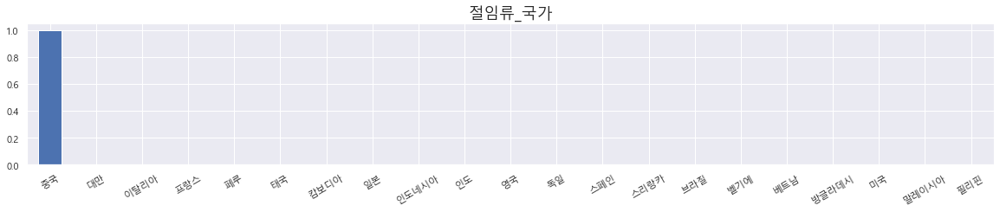

<AxesSubplot:>

Text(0.5, 1.0, '즉석섭취·편의식품류, 기타음료_국가')

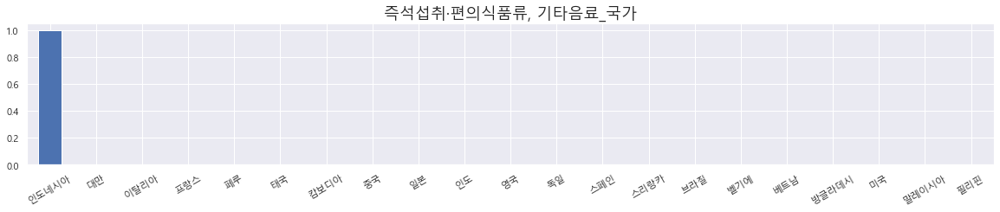

<AxesSubplot:>

Text(0.5, 1.0, '초콜릿류_국가')

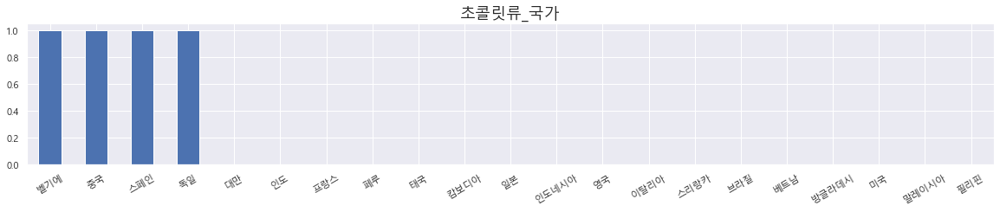

<AxesSubplot:>

Text(0.5, 1.0, '카레(커리)_국가')

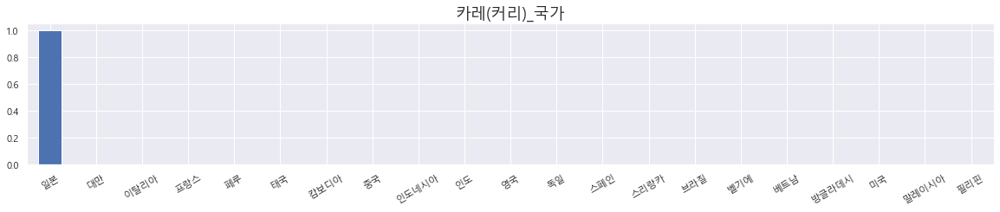

<AxesSubplot:>

Text(0.5, 1.0, '커피_국가')

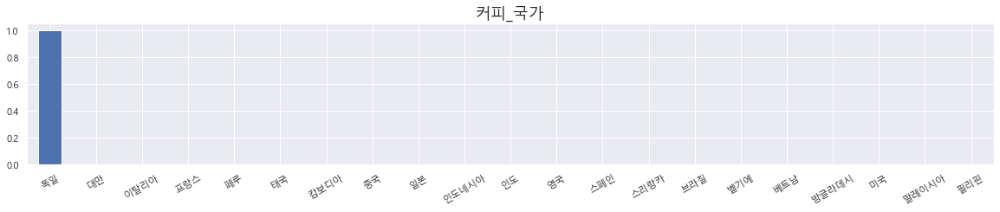

<AxesSubplot:>

Text(0.5, 1.0, '탄산음료류_국가')

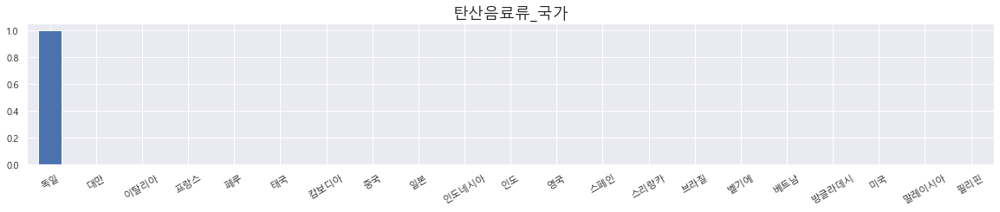

<AxesSubplot:>

Text(0.5, 1.0, '향신료가공품_국가')

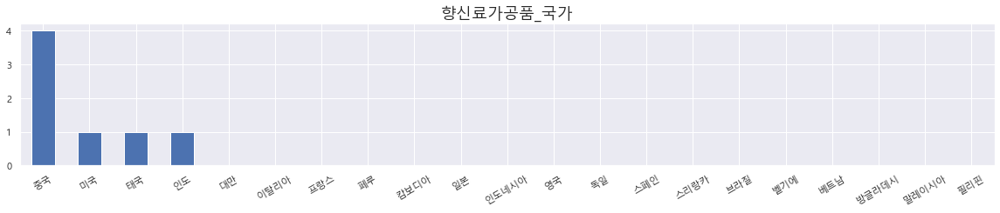

<AxesSubplot:>

Text(0.5, 1.0, '향신료가공품,\n소스류_국가')

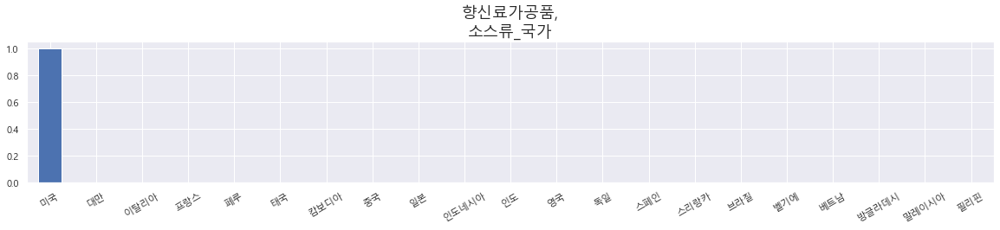

<AxesSubplot:>

Text(0.5, 1.0, '향신료가공품, 기타농산가공품류_국가')

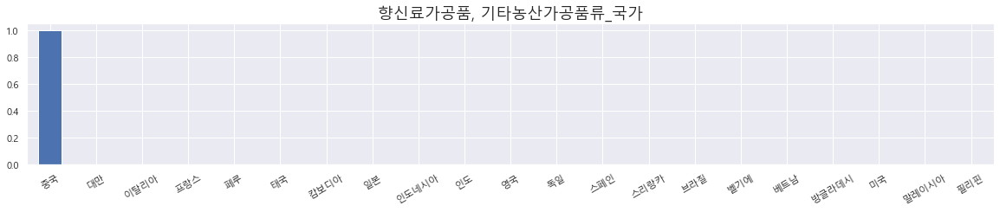

In [594]:
for i, j in data.groupby('식품유형'):
    j.국가.value_counts().plot(kind='bar', rot='30', figsize=(20,3))
    plt.title(i+'_국가', fontsize=18)
    plt.show()

## 한번도 부적합이 없는 품목유형은 

In [580]:
df.columns[df.dtypes =='category']
df.columns[df.dtypes =='float']

for col in df:
    if df[col].nunique() < 20:
        print(col)
        df[col].nunique()

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '판정결과', '업소위치',
       '작업장 연수', '건물소유구분', '주요수출국'],
      dtype='object')

Index(['결과', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '종업원총원', '사무직',
       '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)', '연간생산액($)', '한국수출액($)',
       '한국수출량(kg)'],
      dtype='object')

판정결과


3

업소위치


8

건물소유구분


4

In [610]:
data['판정결과'].value_counts()
data['판정결과'].replace({'적합' : 0, '개선필요': 1, '부적합': 2}, inplace=True)

적합      179
개선필요     26
부적합      20
Name: 판정결과, dtype: int64

<AxesSubplot:xlabel='식품유형'>

pandas.core.series.Series

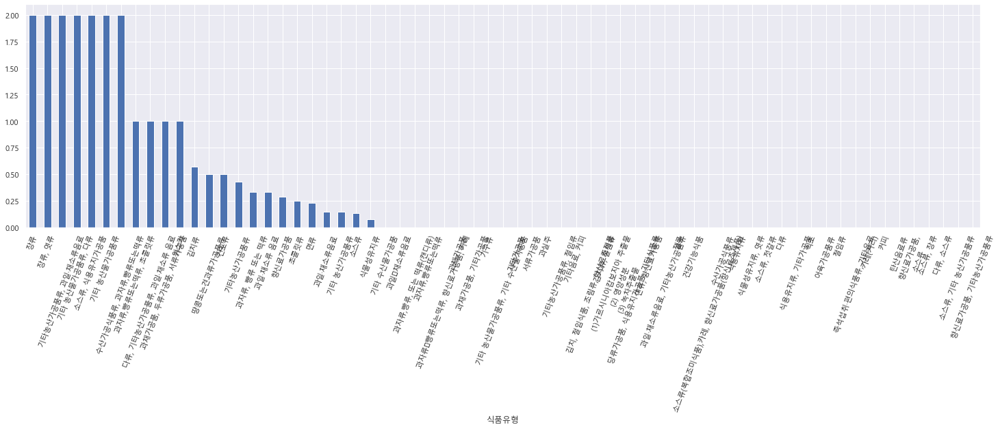

In [615]:
data.groupby('식품유형')['판정결과'].mean().sort_values(ascending=False).nlargest(100).plot(kind='bar', rot='70')
type(data.groupby('식품유형')['판정결과'].mean())

<AxesSubplot:>

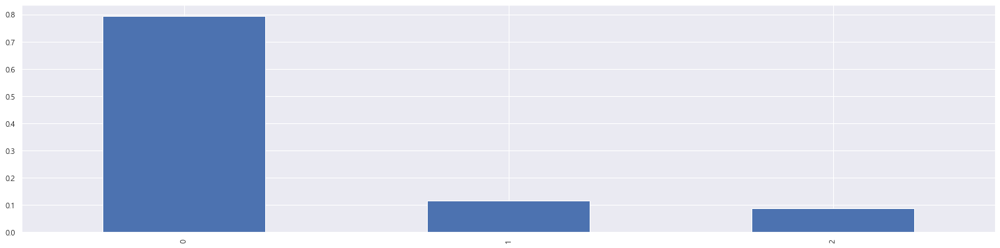

In [618]:
data['판정결과'].value_counts(normalize=True).plot(kind='bar')

In [648]:
tf = data.drop(['제조업소명', '성,도시', '소재지', '해외제조업소코드', '결과', '건수'], axis=1)
columns = tf.columns

theilu = pd.DataFrame(index=['판정결과'], columns= columns)


def cat_corr (df):
    for j in range(0,len(columns)):
        u = theil_u(df['판정결과'].tolist(),df[columns[j]].tolist())
        theilu.loc[:,columns[j]] = u
    theilu.fillna(value=np.nan,inplace=True)

    plt.figure(figsize=(30,2))
    sns.heatmap(theilu,annot=True,fmt='.2f')

    plt.show()

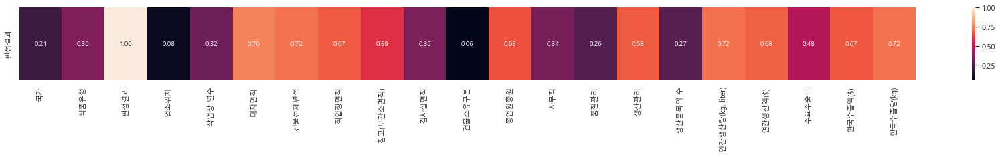

In [649]:
cat_corr(tf)

In [637]:
['제조업소명', '성,도시', '해외제조업소코드', '결과']

Index(['국가', '성,도시', '제조업소명', '소재지', '해외제조업소코드', '식품유형', '결과', '판정결과', '업소위치',
       '작업장 연수', '대지면적', '건물전체면적', '작업장면적', '창고(보관소면적)', '검사실면적', '건물소유구분',
       '종업원총원', '사무직', '품질관리', '생산관리', '생산품목의 수', '연간생산량(kg, liter)',
       '연간생산액($)', '주요수출국', '한국수출액($)', '한국수출량(kg)', '건수'],
      dtype='object')

## End

## Study

In [98]:
s = pd.Series(['cat','hat','dog','fog','pet'])
searchfor = ['og', 'at']
s.str.contains('c|g')
sf = pd.DataFrame(s)
sf
sf[0].apply(lambda x: 'exist' if any(i in x for i in searchfor) else 0)

0     True
1    False
2     True
3     True
4    False
dtype: bool

,0
0,cat
1,hat
2,dog
3,fog
4,pet


0    exist
1    exist
2    exist
3    exist
4        0
Name: 0, dtype: object

In [105]:
sf = pd.DataFrame([('cat', 1000.0), ('hat', 2000000.0), ('dog', 1000.0), ('fog', 330000.0),('pet', 330000.0)], columns=['col1', 'col2'])
sf

,col1,col2
0,cat,1000.0
1,hat,2000000.0
2,dog,1000.0
3,fog,330000.0
4,pet,330000.0


In [126]:
'cat' in sf['col1']

False

In [129]:
'cat' in list(sf['col1'])

True

In [128]:
list(sf['col1'])

['cat', 'hat', 'dog', 'fog', 'pet']

In [122]:
for i in searchfor:
    i
    sf['col1']
    i in sf['col1']

'og'

0    cat
1    hat
2    dog
3    fog
4    pet
Name: col1, dtype: object

False

'at'

0    cat
1    hat
2    dog
3    fog
4    pet
Name: col1, dtype: object

False

In [131]:
a = [True,False,True] # any(---) ---는 iterable
any(a)
a = [False,False,False] 
any(a)

True

False

In [115]:
sf["TrueFalse"] = sf['col1'].apply(lambda x: 1 if any(i in x for i in searchfor) else 0)
sf

,col1,col2,TrueFalse
0,cat,1000.0,1
1,hat,2000000.0,1
2,dog,1000.0,1
3,fog,330000.0,1
4,pet,330000.0,0


In [179]:
df['대지면적'].apply(lambda x : type(x))

0      <class 'str'>
1      <class 'str'>
2      <class 'str'>
3      <class 'str'>
4      <class 'str'>
           ...      
222    <class 'str'>
223    <class 'str'>
224    <class 'str'>
225    <class 'str'>
226    <class 'str'>
Name: 대지면적, Length: 225, dtype: object

In [196]:
df.loc[df['대지면적'].str.contains('-'), '대지면적']

20     -
84     -
116    -
128    -
140    -
179    -
180    -
192    -
194    -
197    -
198    -
221    -
222    -
Name: 대지면적, dtype: object

In [211]:
import re
p = re.compile('[0-9]+')

In [215]:
import re
text = "에러 1122 : 레퍼런스 오류\n 에러 1033: 아규먼트 오류"
text = "10-33"
regex = re.compile("1033")
regex = re.compile(p)
mo = regex.search(text)
mo = regex.findall(text)
mo

['10', '33']